In [20]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time

from sklearn.svm import SVC
import seaborn as sns

In [2]:
from sklearn.svm import SVC
from sklearn.svm import LinearSVC 
from sklearn.linear_model import SGDClassifier , LogisticRegression

from sklearn.metrics import confusion_matrix , accuracy_score

from sklearn.model_selection import cross_val_score ,learning_curve ,GridSearchCV
from sklearn_evaluation import plot

In [3]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from scipy.stats.mstats import winsorize

In [6]:
#Importation de la base de données
data = pd.read_csv("C:/Users/yavav/Downloads/heart_attack_risk_dataset.csv")

# Analyse Exploratoire

In [7]:
data.sample(5)

,Age,Gender,Smoking,Alcohol_Consumption,Physical_Activity_Level,BMI,Diabetes,Hypertension,Cholesterol_Level,Resting_BP,Heart_Rate,Family_History,Stress_Level,Chest_Pain_Type,Thalassemia,Fasting_Blood_Sugar,ECG_Results,Exercise_Induced_Angina,Max_Heart_Rate_Achieved,Heart_Attack_Risk
28971,59,Female,1,1,Low,15.20,0,0,230.2,115,67,0,Moderate,Atypical,Reversible defect,0,Normal,0,129,High
96,40,Male,0,0,Low,37.71,1,0,185.1,102,81,0,Moderate,Atypical,Reversible defect,1,ST-T abnormality,0,154,Moderate
45858,22,Female,1,1,Low,19.25,1,0,152.0,174,107,1,Low,Typical,Fixed defect,0,Left Ventricular Hypertrophy,0,150,Moderate
33580,49,Male,1,1,Low,28.36,1,0,243.8,129,109,0,Moderate,Asymptomatic,Normal,0,Normal,0,177,High
10657,64,Female,1,1,Moderate,19.71,0,0,158.0,149,70,0,High,Atypical,Normal,0,Normal,0,173,Moderate


In [8]:
data.describe()

,Age,Smoking,Alcohol_Consumption,BMI,Diabetes,Hypertension,Cholesterol_Level,Resting_BP,Heart_Rate,Family_History,Fasting_Blood_Sugar,Exercise_Induced_Angina,Max_Heart_Rate_Achieved
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000,50000.00000,50000.000000,50000.000000,50000.000000
mean,53.398700,0.298420,0.401980,27.519357,0.198840,0.29738,225.036444,134.434100,94.530480,0.30034,0.149360,0.201640,149.305340
std,20.799006,0.457569,0.490303,7.225176,0.399131,0.45711,43.317373,25.907961,20.187124,0.45841,0.356447,0.401229,28.823699
min,18.000000,0.000000,0.000000,15.000000,0.000000,0.00000,150.000000,90.000000,60.000000,0.00000,0.000000,0.000000,100.000000
25%,35.000000,0.000000,0.000000,21.270000,0.000000,0.00000,187.300000,112.000000,77.000000,0.00000,0.000000,0.000000,124.000000
50%,53.000000,0.000000,0.000000,27.540000,0.000000,0.00000,225.100000,134.000000,94.000000,0.00000,0.000000,0.000000,149.000000
75%,71.000000,1.000000,1.000000,33.770000,0.000000,1.00000,262.600000,157.000000,112.000000,1.00000,0.000000,0.000000,174.000000
max,89.000000,1.000000,1.000000,40.000000,1.000000,1.00000,300.000000,179.000000,129.000000,1.00000,1.000000,1.000000,199.000000


## Format des variables

In [4]:
data.info() #Ce code nous permet de voir que les variables ont un format adéquat, excepté les types "object" qui devraient être transformées en catégorie. 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      50000 non-null  int64  
 1   Gender                   50000 non-null  object 
 2   Smoking                  50000 non-null  int64  
 3   Alcohol_Consumption      50000 non-null  int64  
 4   Physical_Activity_Level  50000 non-null  object 
 5   BMI                      50000 non-null  float64
 6   Diabetes                 50000 non-null  int64  
 7   Hypertension             50000 non-null  int64  
 8   Cholesterol_Level        50000 non-null  float64
 9   Resting_BP               50000 non-null  int64  
 10  Heart_Rate               50000 non-null  int64  
 11  Family_History           50000 non-null  int64  
 12  Stress_Level             50000 non-null  object 
 13  Chest_Pain_Type          50000 non-null  object 
 14  Thalassemia           

In [9]:
for col in data.columns:
    if data[col].dtype == 'object':
        data[col] = data[col].astype('category') #On transforme les "objects" en catégorie

In [5]:
#vérification
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Age                      50000 non-null  int64   
 1   Gender                   50000 non-null  category
 2   Smoking                  50000 non-null  int64   
 3   Alcohol_Consumption      50000 non-null  int64   
 4   Physical_Activity_Level  50000 non-null  category
 5   BMI                      50000 non-null  float64 
 6   Diabetes                 50000 non-null  int64   
 7   Hypertension             50000 non-null  int64   
 8   Cholesterol_Level        50000 non-null  float64 
 9   Resting_BP               50000 non-null  int64   
 10  Heart_Rate               50000 non-null  int64   
 11  Family_History           50000 non-null  int64   
 12  Stress_Level             50000 non-null  category
 13  Chest_Pain_Type          50000 non-null  category
 14  Thalas

## Valeurs manquantes

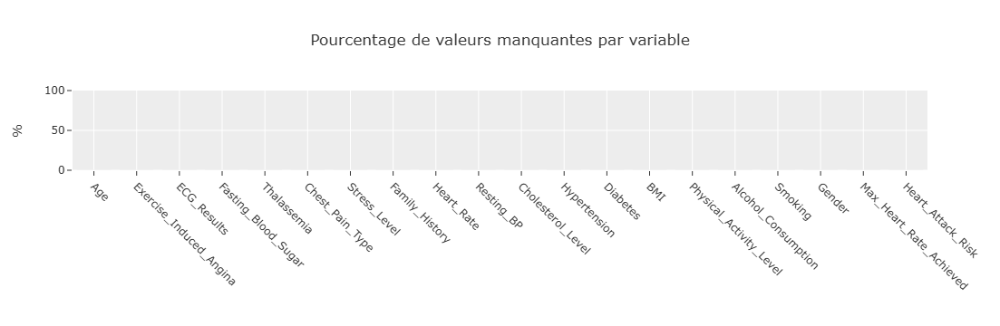

In [6]:
na = data.isna().sum()/data.shape[0]*100 #Ce code nous permet de vérifier qu'il n'y a pas de valeurs manquantes dans le dataset

px.bar(na.sort_values(),
         title = "Pourcentage de valeurs manquantes par variable",
         color_discrete_sequence = ["#377eb8"],
         template='ggplot2',
         range_y = [0,100],
         width=800,
         labels={'value':'%', 'index':''},
         color=None
        ).update_traces(showlegend=False).update_xaxes(tickangle=45)

## Variable d'intérêt

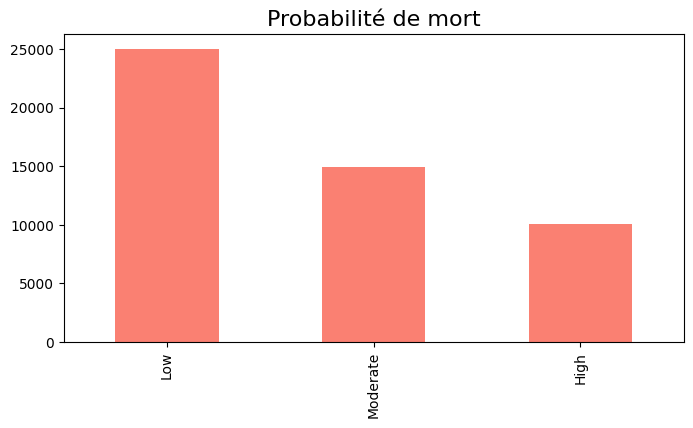

In [106]:
p = data['Heart_Attack_Risk'].value_counts().plot(
    kind='bar',
    color='salmon',
    figsize=(8, 4)
)

plt.title("Probabilité de mort", fontsize=16)
plt.show()
#On visualise la distribution de la variable target 

In [9]:
data['Heart_Attack_Risk'].value_counts(normalize=True)*100
# Pourcentage de chaque catégorie de la variable target

Low         50.048
Moderate    29.808
High        20.144
Name: Heart_Attack_Risk, dtype: float64

## Variables explicatives 

### Variables catégorielles

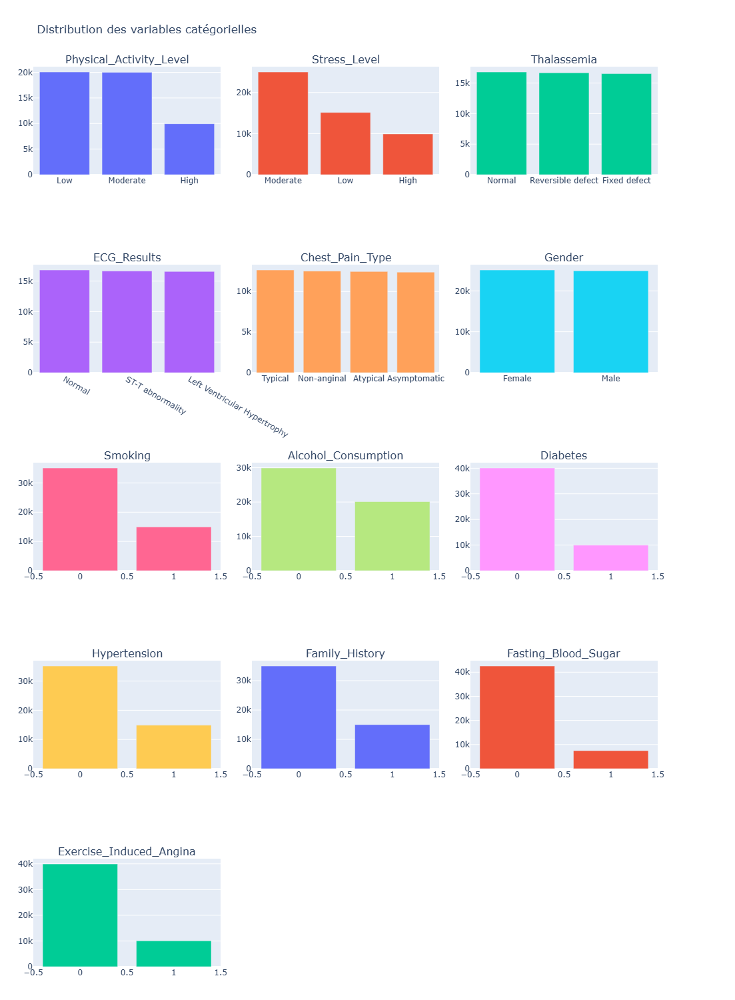

In [19]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=5, cols=3,
                    vertical_spacing=0.1,   
                    horizontal_spacing=0.05,
                    subplot_titles=("Physical_Activity_Level", "Stress_Level", "Thalassemia", "ECG_Results", "Chest_Pain_Type", "Gender", "Smoking", "Alcohol_Consumption", "Diabetes", "Hypertension", "Family_History", "Fasting_Blood_Sugar", "Exercise_Induced_Angina")
)

fig.add_trace(go.Bar(x=data['Physical_Activity_Level'].value_counts().index,
                        y=data['Physical_Activity_Level'].value_counts().values,
                        name="Physical_Activity_Level"),
                row=1, col=1)

fig.add_trace(go.Bar(x=data['Stress_Level'].value_counts().index,
                        y=data['Stress_Level'].value_counts().values,
                        name="Stress_Level"),
                row=1, col=2)

fig.add_trace(go.Bar(x=data['Thalassemia'].value_counts().index,
                        y=data['Thalassemia'].value_counts().values,
                        name="Thalassemia"),
                row=1, col=3)

fig.add_trace(go.Bar(x=data['ECG_Results'].value_counts().index,
                        y=data['ECG_Results'].value_counts().values,
                        name="ECG_Results"),
                row=2, col=1)

fig.add_trace(go.Bar(x=data['Chest_Pain_Type'].value_counts().index,
                        y=data['Chest_Pain_Type'].value_counts().values,
                        name="Chest_Pain_Type"),
                row=2, col=2)


fig.add_trace(go.Bar(x=data['Gender'].value_counts().index,
                        y=data['Gender'].value_counts().values,
                        name="Gender"),
                row=2, col=3)

fig.add_trace(go.Bar(x=data['Smoking'].value_counts().index,
                        y=data['Smoking'].value_counts().values,
                        name="Smoking"),
                row=3, col=1)

fig.add_trace(go.Bar(x=data['Alcohol_Consumption'].value_counts().index,
                        y=data['Alcohol_Consumption'].value_counts().values,
                        name="Alcohol_Consumption"),
                row=3, col=2)

fig.add_trace(go.Bar(x=data['Diabetes'].value_counts().index,
                        y=data['Diabetes'].value_counts().values,
                        name="Diabetes"),
                row=3, col=3)

fig.add_trace(go.Bar(x=data['Hypertension'].value_counts().index,
                        y=data['Hypertension'].value_counts().values,
                        name="Hypertension"),
                row=4, col=1)

fig.add_trace(go.Bar(x=data['Family_History'].value_counts().index,
                        y=data['Family_History'].value_counts().values,
                        name="Family_History"),
                row=4, col=2)

fig.add_trace(go.Bar(x=data['Fasting_Blood_Sugar'].value_counts().index,
                        y=data['Fasting_Blood_Sugar'].value_counts().values,
                        name="Fasting_Blood_Sugar"),
                row=4, col=3)

fig.add_trace(go.Bar(x=data['Exercise_Induced_Angina'].value_counts().index,
                        y=data['Exercise_Induced_Angina'].value_counts().values,
                        name="Exercise_Induced_Angina"),
                row=5, col=1)

#On améliore la sortie graphique
fig.update_layout(
    height=1500, 
    showlegend=False,
    title_text="Distribution des variables catégorielles",
    margin=dict(t=100, b=50, l=50, r=50)
)

fig.show()

### Variables numériques

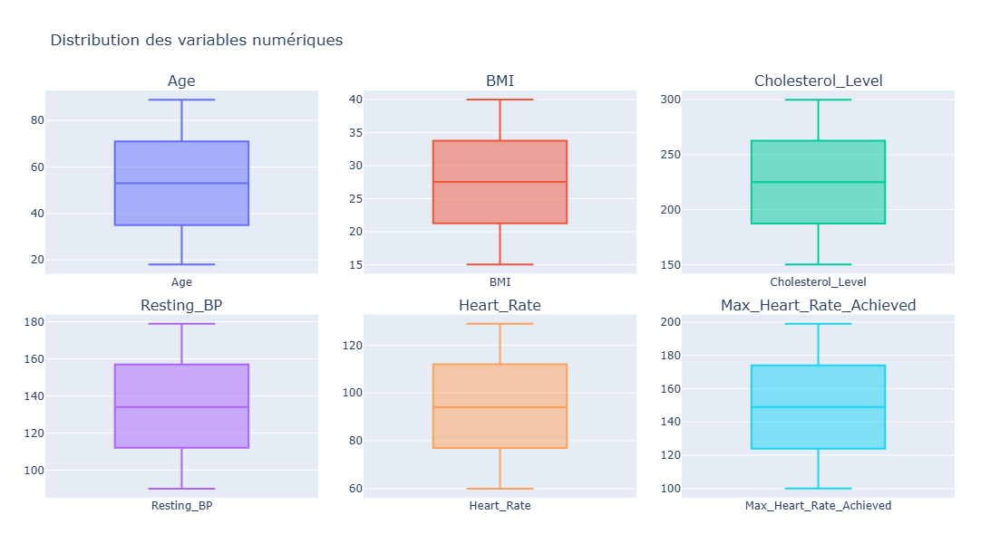

In [108]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=2, cols=3,
                    vertical_spacing=0.1,   
                    horizontal_spacing=0.05,
                    subplot_titles=("Age", "BMI", "Cholesterol_Level", "Resting_BP", "Heart_Rate", "Max_Heart_Rate_Achieved")
)

fig.add_trace(go.Box(y=data['Age'],
                        name="Age",
                        boxpoints='outliers'),
                row=1, col=1)

fig.add_trace(go.Box(y=data['BMI'],
                        name="BMI",
                        boxpoints='outliers'),
                row=1, col=2)

fig.add_trace(go.Box(y=data['Cholesterol_Level'],
                        name="Cholesterol_Level",
                        boxpoints='outliers'),
                row=1, col=3)

fig.add_trace(go.Box(y=data['Resting_BP'],
                        name="Resting_BP",
                        boxpoints='outliers'),
                row=2, col=1)

fig.add_trace(go.Box(y=data['Heart_Rate'],
                        name="Heart_Rate",
                        boxpoints='outliers'),
                row=2, col=2)

fig.add_trace(go.Box(y=data['Max_Heart_Rate_Achieved'],
                        name="Max_Heart_Rate_Achieved",
                        boxpoints='outliers'),
                row=2, col=3)

#On améliore la sortie graphique
fig.update_layout(
    height=600, 
    showlegend=False,
    title_text="Distribution des variables numériques",
    margin=dict(t=100, b=50, l=50, r=50)
)

fig.show()

On observe des distributions très normales et équilibrées, sans acune valeur atypique. Par conséquent, aucun nettoyage de données pour faire face aux valeurs aberrantes sera appliqué. 

## Corrélation et analyse bivariée

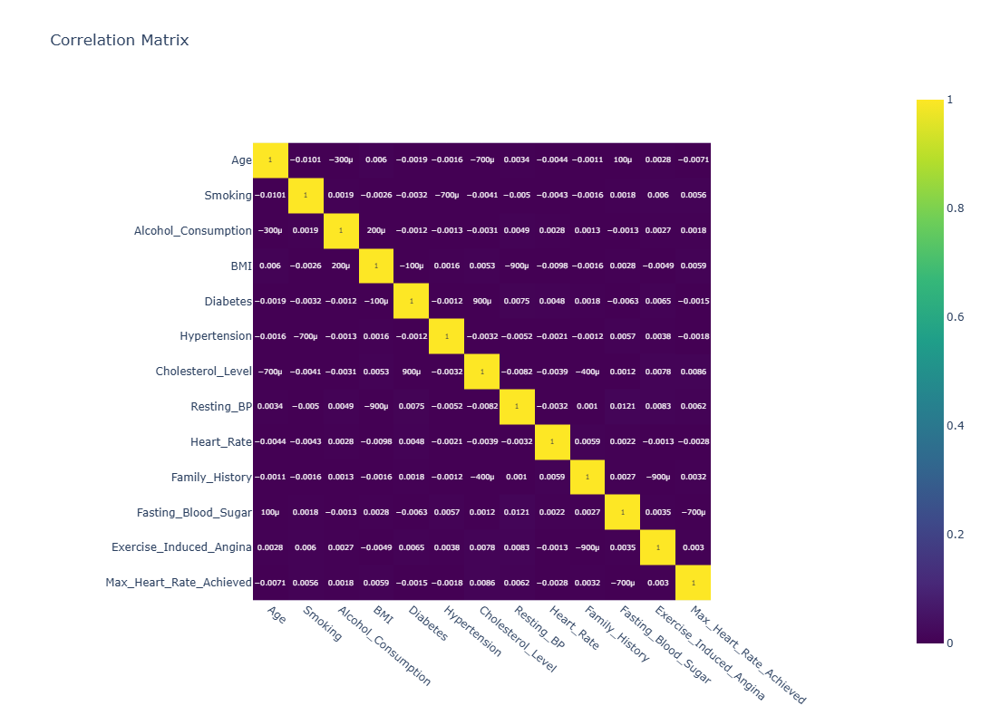

In [22]:
correlation =  round(data.corr(numeric_only = True),  ndigits=4)

fig = px.imshow(correlation,
                text_auto=True,
                color_continuous_scale = 'Viridis',
                range_color=(0, 1),
                title='Correlation Matrix',
                width=800,
                height=800
            )

fig.update_xaxes(tickangle=40)

fig.show()

In [12]:
# Séparation des variables qualitatives
qualitative_vars = data.select_dtypes(include='category').columns.drop('Heart_Attack_Risk').tolist()
print("Variables qualitatives:", qualitative_vars)

Variables qualitatives: ['Gender', 'Physical_Activity_Level', 'Stress_Level', 'Chest_Pain_Type', 'Thalassemia', 'ECG_Results']


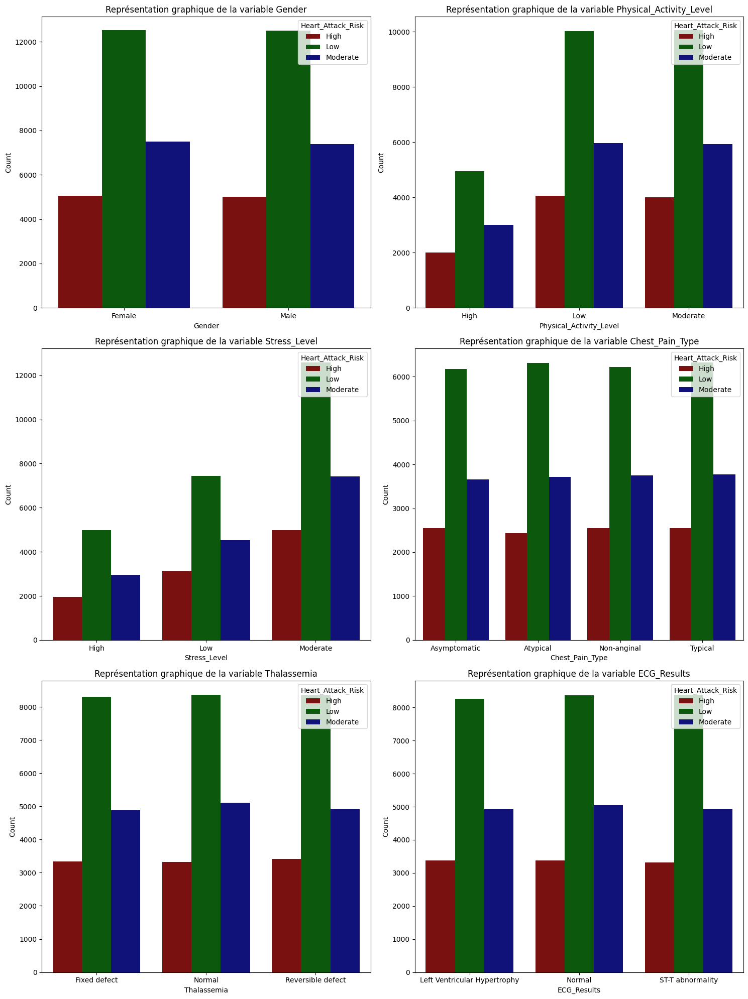

In [17]:
# Define the color palette for Heart_Attack_Risk
palette = {'Low': 'darkgreen', 'Moderate': 'darkblue', 'High': 'darkred'}

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(15, 20))
axes = axes.flatten()

for i, col in enumerate(qualitative_vars):
    sns.countplot(data=data, x=col, hue='Heart_Attack_Risk', palette=palette, ax=axes[i])
    axes[i].set_title(f"Représentation graphique de la variable {col}")
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Count')
    axes[i].legend(title='Heart_Attack_Risk', loc='upper right')

plt.tight_layout()
plt.show()

On observe qu'il n'y a pas de problème d'autocorrélation entre les variables. Au contraire, la corrélation entre les variables explicatives est très faible. Par conséqunet, chaque variable individuelle a le potentiel d'apporter une information unique et pertinente, raison pour laquelle nous les gardons toutes dans notre analyse.  

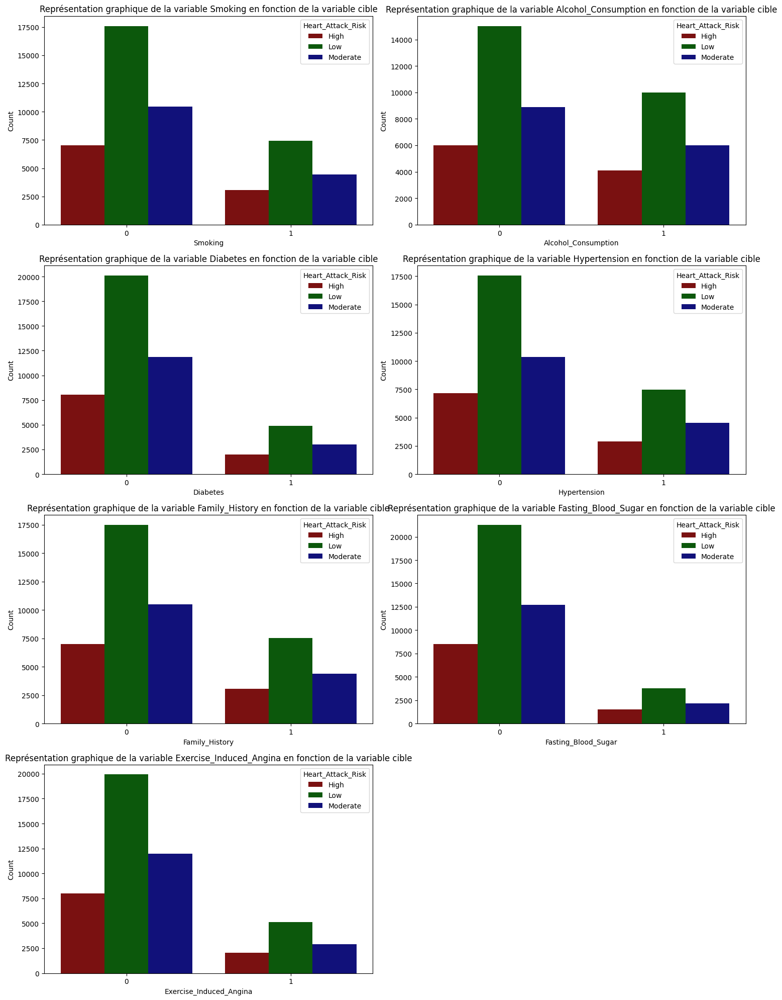

In [20]:
# represenation graphique des variables bianaires en fonction de la variable cible*
binary_vars = ['Smoking', 'Alcohol_Consumption', 'Diabetes', 'Hypertension', 'Family_History', 'Fasting_Blood_Sugar', 'Exercise_Induced_Angina']

# Adjust the number of rows and columns based on the number of binary variables
n_vars = len(binary_vars)
n_cols = 2
n_rows = (n_vars + n_cols - 1) // n_cols  # Calculate the number of rows needed

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(binary_vars):
    if data[col].nunique() == 2:  # 
        sns.countplot(data=data, x=col, hue='Heart_Attack_Risk', palette=palette, ax=axes[i])
        axes[i].set_title(f"Représentation graphique de la variable {col} en fonction de la variable cible")
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].legend(title='Heart_Attack_Risk', loc='upper right')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

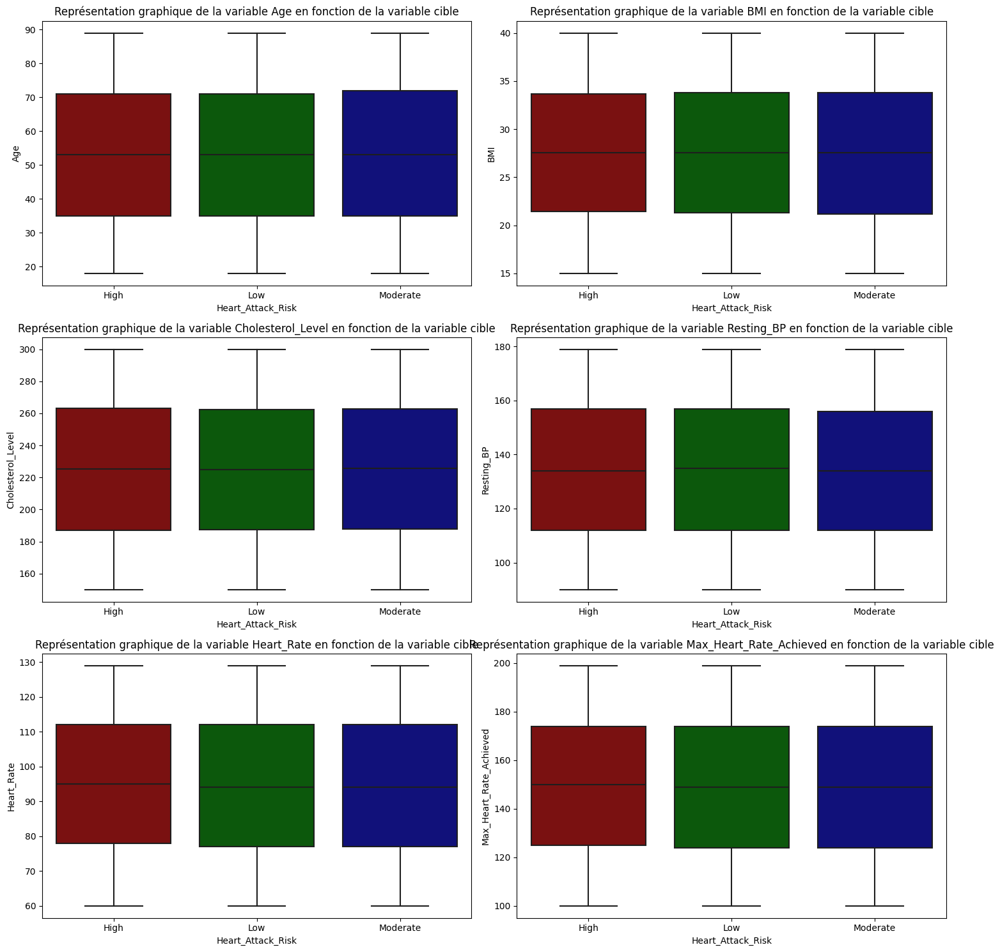

In [21]:
quantitative_vars = ['Age', 'BMI', 'Cholesterol_Level', 'Resting_BP', 'Heart_Rate', 'Max_Heart_Rate_Achieved']

n_vars = len(quantitative_vars)
n_cols = 2
n_rows = (n_vars + n_cols - 1) // n_cols  #

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(quantitative_vars):
    sns.boxplot(data=data, x='Heart_Attack_Risk', y=col, palette=palette, ax=axes[i])
    axes[i].set_title(f"Représentation graphique de la variable {col} en fonction de la variable cible")
    axes[i].set_xlabel('Heart_Attack_Risk')
    axes[i].set_ylabel(col)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

### CODAGE DES VARIABLES

Nous transformons les variables explicatives comportant plusieurs modalités en variables binaires, supprimant la première modalité afin d'éviter la multicollinéarité. 

In [10]:
columns = ['Gender', 'Thalassemia', 'ECG_Results', 'Chest_Pain_Type'] 
encoded_data = pd.get_dummies(data, columns=columns, drop_first=True)

En ce qui concerne la variable dépendante, il s'agit d'une variable qualitative ordinale avec trois niveaux: Low, Moderate, et High. Nous pouvons commencer par assigner différents nombres qui reflètent cette ordinalité. Pour cela, nous pouvons utiliser le Ordinal Encoder. Nous appliquons la même procédure aux variables: Stress_Level et Physical_Activity

In [11]:
from sklearn.preprocessing import OrdinalEncoder

oe = OrdinalEncoder(categories=[
    ['Low', 'Moderate', 'High'],  # Pour 'Heart_Attack_Risk'
    ['Low', 'Moderate', 'High'],  # Pour 'Stress_Level'
    ['Low', 'Moderate', 'High']   # Pour 'Physical_Activity_Level'
])

encoded_data[['Heart_Attack_Risk', 'Stress_Level', 'Physical_Activity_Level']] = \
    oe.fit_transform(encoded_data[['Heart_Attack_Risk', 'Stress_Level', 'Physical_Activity_Level']])

In [17]:
encoded_data.info() #On vérifie

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Age                            50000 non-null  int64  
 1   Smoking                        50000 non-null  int64  
 2   Alcohol_Consumption            50000 non-null  int64  
 3   Physical_Activity_Level        50000 non-null  float64
 4   BMI                            50000 non-null  float64
 5   Diabetes                       50000 non-null  int64  
 6   Hypertension                   50000 non-null  int64  
 7   Cholesterol_Level              50000 non-null  float64
 8   Resting_BP                     50000 non-null  int64  
 9   Heart_Rate                     50000 non-null  int64  
 10  Family_History                 50000 non-null  int64  
 11  Stress_Level                   50000 non-null  float64
 12  Fasting_Blood_Sugar            50000 non-null 

### RESAMPLE

In [12]:
from sklearn.utils import resample

max_samples = encoded_data['Heart_Attack_Risk'].value_counts().max()

resampled_data = []

for class_label in encoded_data['Heart_Attack_Risk'].unique():
    class_data = encoded_data[encoded_data['Heart_Attack_Risk'] == class_label]
    class_oversampled = resample(class_data,
                                 replace=True,
                                 n_samples=max_samples,
                                 random_state=42)
    resampled_data.append(class_oversampled)
 
dataset_resampled = pd.concat(resampled_data)

### JEU DE TEST ET D'ENTRAINEMENT

In [13]:
y_multi = dataset_resampled['Heart_Attack_Risk']
X_multi = dataset_resampled.drop('Heart_Attack_Risk', axis=1)

In [14]:
from sklearn.model_selection import train_test_split
#On découpe en train et test
X_train_multi, X_test_multi, y_train_multi, y_test_multi = train_test_split(X_multi, y_multi, test_size=0.3, random_state=42)

In [15]:
#On réduit la volumétrie
# Cortar 2000 filas de X_train y y_train
X_train_multi = X_train_multi[:3000]
y_train_multi = y_train_multi[:3000]

# Cortar 2000 filas de X_test y y_test
X_test_multi = X_test_multi[:1000]
y_test_multi = y_test_multi[:1000]

### NOMALISATION DES VARIBALES

In [14]:
from sklearn.preprocessing import MinMaxScaler

#La partie train
Cols_num = ["Age", "BMI", "Cholesterol_Level", "Resting_BP", "Heart_Rate", "Max_Heart_Rate_Achieved"]
Colstrain = [col for col in X_train_multi.columns if col in Cols_num]
scaler = MinMaxScaler()
Xtrain_multi_standard = scaler.fit_transform(X_train_multi[Colstrain])
X_train_multi = X_train_multi.copy()
X_train_multi[Colstrain] = Xtrain_multi_standard

#La partie test
Colstest = [col for col in X_test_multi.columns if col in Cols_num]
scaler = MinMaxScaler()
Xtest_multi_standard = scaler.fit_transform(X_test_multi[Colstest])
X_test_multi = X_test_multi.copy()
X_test_multi[Colstest] = Xtest_multi_standard

In [15]:
#On vérifie
X_train_multi.sample(5)

,Age,Smoking,Alcohol_Consumption,Physical_Activity_Level,BMI,Diabetes,Hypertension,Cholesterol_Level,Resting_BP,Heart_Rate,...,Exercise_Induced_Angina,Max_Heart_Rate_Achieved,Gender_Male,Thalassemia_Normal,Thalassemia_Reversible defect,ECG_Results_Normal,ECG_Results_ST-T abnormality,Chest_Pain_Type_Atypical,Chest_Pain_Type_Non-anginal,Chest_Pain_Type_Typical
2719,0.309859,0,1,2.0,0.6840,1,0,0.078667,0.056180,0.217391,...,0,0.474747,1,0,0,0,1,0,1,0
31434,0.746479,0,1,2.0,0.6188,0,0,0.874667,0.314607,0.478261,...,0,0.787879,0,0,1,0,1,0,0,0
5713,0.042254,0,1,1.0,0.5120,0,0,0.394000,0.438202,0.420290,...,0,0.151515,0,0,1,0,1,0,1,0
48256,0.042254,0,1,1.0,0.2652,1,1,0.008667,0.842697,0.913043,...,0,0.747475,1,0,0,1,0,0,0,1
38727,0.676056,0,0,0.0,0.1520,0,0,0.986000,0.483146,0.869565,...,0,0.111111,0,1,0,0,0,0,0,1


# Modèles

## SVM MultiClass: Linéaire et non Linéaire 

In [16]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.multiclass import OneVsOneClassifier

In [17]:
#Modèles SVC
#linéaire
c_svc_ovo_linear = SVC(kernel='linear', random_state=42 , decision_function_shape='ovo')
c_svc_ovr_linear = SVC(kernel='linear', random_state=42 , decision_function_shape='ovr')

#non linéaire rbf 
c_svc_ovo_rbf = SVC(kernel='rbf', random_state=42 , decision_function_shape='ovo')
c_svc_ovr_rbf = SVC(kernel='rbf', random_state=42 , decision_function_shape='ovr')

#non linéaire poly
c_svc_ovo_poly = SVC(kernel='poly', random_state=42 , decision_function_shape='ovo')
c_svc_ovr_poly = SVC(kernel='poly', random_state=42 , decision_function_shape='ovr')

#Déclare modèle
OVO_SVC_linear = OneVsOneClassifier(c_svc_ovo_linear)
OVR_SVC_linear = OneVsRestClassifier(c_svc_ovr_linear)

OVO_SVC_poly = OneVsOneClassifier(c_svc_ovo_poly)
OVR_SVC_poly = OneVsRestClassifier(c_svc_ovr_poly)

OVO_SVC_rbf = OneVsOneClassifier(c_svc_ovo_rbf)
OVR_SVC_rbf = OneVsRestClassifier(c_svc_ovr_rbf)

### Fit et evaluation du modèle SVM linéaire

In [19]:
#Fit the model
OVO_SVC_linear.fit(X_train_multi, y_train_multi)
OVR_SVC_linear.fit(X_train_multi, y_train_multi)

OneVsRestClassifier(estimator=SVC(kernel='linear', random_state=42))

In [20]:
#Qualité de prédiction du modèle OVO
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, roc_auc_score

confusion_matrix(OVO_SVC_linear.predict(X_test_multi), y_test_multi)
print(classification_report(y_test_multi, OVO_SVC_linear.predict(X_test_multi)))
print(confusion_matrix(y_test_multi, OVO_SVC_linear.predict(X_test_multi)))
print("Train accuracy for OVO:", accuracy_score(y_train_multi, OVO_SVC_linear.predict(X_train_multi)))
print("Test accuracy for OVO:", accuracy_score(y_test_multi, OVO_SVC_linear.predict(X_test_multi)))
print("F1 Score for OVO:", f1_score(y_test_multi, OVO_SVC_linear.predict(X_test_multi), average = 'weighted'))

              precision    recall  f1-score   support

         0.0       0.37      0.38      0.37       347
         1.0       0.33      0.42      0.37       337
         2.0       0.34      0.22      0.27       316

    accuracy                           0.34      1000
   macro avg       0.34      0.34      0.34      1000
weighted avg       0.34      0.34      0.34      1000

[[132 148  67]
 [123 141  73]
 [106 139  71]]
Train accuracy for OVO: 0.38533333333333336
Test accuracy for OVO: 0.344
F1 Score for OVO: 0.3387633915457927


In [44]:
#Qualité de prédiction du modèle OVR
print(classification_report(y_test_multi, OVR_SVC_linear.predict(X_test_multi)))
print(confusion_matrix(y_test_multi, OVR_SVC_linear.predict(X_test_multi)))
print("Train accuracy for OVR:", accuracy_score(y_train_multi, OVR_SVC_linear.predict(X_train_multi)))
print("Test accuracy for OVR:", accuracy_score(y_test_multi, OVR_SVC_linear.predict(X_test_multi)))
print("F1 Score for OVR:", f1_score(y_test_multi, OVR_SVC_linear.predict(X_test_multi), average = 'weighted'))

              precision    recall  f1-score   support

         0.0       0.34      0.32      0.33       347
         1.0       0.35      0.32      0.34       337
         2.0       0.30      0.34      0.32       316

    accuracy                           0.33      1000
   macro avg       0.33      0.33      0.33      1000
weighted avg       0.33      0.33      0.33      1000

[[111 101 135]
 [107 109 121]
 [107 101 108]]
Train accuracy for OVR: 0.342
Test accuracy for OVR: 0.328
F1 Score for OVR: 0.3283838559497873


### Fit et évaluation du modèle non linéaire Poly

In [21]:
#Fit the model
OVO_SVC_poly.fit(X_train_multi, y_train_multi)
OVR_SVC_poly.fit(X_train_multi, y_train_multi)

OneVsRestClassifier(estimator=SVC(kernel='poly', random_state=42))

In [46]:
#Qualité du modèle OVO
confusion_matrix(OVO_SVC_poly.predict(X_test_multi), y_test_multi)
print(classification_report(y_test_multi, OVO_SVC_poly.predict(X_test_multi)))
print(confusion_matrix(y_test_multi, OVO_SVC_poly.predict(X_test_multi)))
print("Train accuracy for OVO:", accuracy_score(y_train_multi, OVO_SVC_poly.predict(X_train_multi)))
print("Test accuracy for OVO:", accuracy_score(y_test_multi, OVO_SVC_poly.predict(X_test_multi)))
print("F1 Score for OVO:", f1_score(y_test_multi, OVO_SVC_poly.predict(X_test_multi), average = 'weighted'))

              precision    recall  f1-score   support

         0.0       0.36      0.33      0.35       347
         1.0       0.37      0.47      0.41       337
         2.0       0.34      0.27      0.30       316

    accuracy                           0.36      1000
   macro avg       0.36      0.36      0.35      1000
weighted avg       0.36      0.36      0.35      1000

[[116 140  91]
 [106 157  74]
 [ 99 132  85]]
Train accuracy for OVO: 0.6463333333333333
Test accuracy for OVO: 0.358
F1 Score for OVO: 0.3535702339704247


In [47]:
#Qualité du modèle OVR
print(classification_report(y_test_multi, OVR_SVC_poly.predict(X_test_multi)))
print(confusion_matrix(y_test_multi, OVR_SVC_poly.predict(X_test_multi)))
print("Train accuracy for OVR:", accuracy_score(y_train_multi, OVR_SVC_poly.predict(X_train_multi)))
print("Test accuracy for OVR:", accuracy_score(y_test_multi, OVR_SVC_poly.predict(X_test_multi)))
print("F1 Score for OVR:", f1_score(y_test_multi, OVR_SVC_poly.predict(X_test_multi), average = 'weighted'))

              precision    recall  f1-score   support

         0.0       0.37      0.37      0.37       347
         1.0       0.38      0.40      0.39       337
         2.0       0.36      0.34      0.35       316

    accuracy                           0.37      1000
   macro avg       0.37      0.37      0.37      1000
weighted avg       0.37      0.37      0.37      1000

[[130 118  99]
 [114 134  89]
 [106 103 107]]
Train accuracy for OVR: 0.7006666666666667
Test accuracy for OVR: 0.371
F1 Score for OVR: 0.37063248771893303


### Fit et évaluation du modèle non linéaire RBF

In [22]:
#Fit the model
OVO_SVC_rbf.fit(X_train_multi, y_train_multi)
OVR_SVC_rbf.fit(X_train_multi, y_train_multi)

OneVsRestClassifier(estimator=SVC(random_state=42))

In [49]:
#Qualité du modèle OVO
confusion_matrix(OVO_SVC_rbf.predict(X_test_multi), y_test_multi)
print(classification_report(y_test_multi, OVO_SVC_rbf.predict(X_test_multi)))
print(confusion_matrix(y_test_multi, OVO_SVC_rbf.predict(X_test_multi)))
print("Train accuracy for OVO:", accuracy_score(y_train_multi, OVO_SVC_rbf.predict(X_train_multi)))
print("Test accuracy for OVO:", accuracy_score(y_test_multi, OVO_SVC_rbf.predict(X_test_multi)))
print("F1 Score for OVO:", f1_score(y_test_multi, OVO_SVC_rbf.predict(X_test_multi), average = 'weighted'))

              precision    recall  f1-score   support

         0.0       0.37      0.32      0.34       347
         1.0       0.33      0.45      0.38       337
         2.0       0.30      0.24      0.27       316

    accuracy                           0.34      1000
   macro avg       0.34      0.34      0.33      1000
weighted avg       0.34      0.34      0.33      1000

[[110 148  89]
 [100 152  85]
 [ 87 154  75]]
Train accuracy for OVO: 0.587
Test accuracy for OVO: 0.337
F1 Score for OVO: 0.3319512449843346


In [50]:
#Qualité du modèle OVR
print(classification_report(y_test_multi, OVR_SVC_rbf.predict(X_test_multi)))
print(confusion_matrix(y_test_multi, OVR_SVC_rbf.predict(X_test_multi)))
print("Train accuracy for OVR:", accuracy_score(y_train_multi, OVR_SVC_rbf.predict(X_train_multi)))
print("Test accuracy for OVR:", accuracy_score(y_test_multi, OVR_SVC_rbf.predict(X_test_multi)))
print("F1 Score for OVR:", f1_score(y_test_multi, OVR_SVC_rbf.predict(X_test_multi), average = 'weighted'))

              precision    recall  f1-score   support

         0.0       0.38      0.37      0.37       347
         1.0       0.38      0.42      0.40       337
         2.0       0.34      0.30      0.32       316

    accuracy                           0.37      1000
   macro avg       0.36      0.36      0.36      1000
weighted avg       0.36      0.37      0.36      1000

[[127 116 104]
 [111 143  83]
 [ 99 121  96]]
Train accuracy for OVR: 0.818
Test accuracy for OVR: 0.366
F1 Score for OVR: 0.3645695286797496


## Régression Logistique

In [43]:
lgr = LogisticRegression(random_state=42)
lgr.fit(X_train_multi, y_train_multi)

y_pred = lgr.predict(X_test_multi)

In [44]:
#Qualité du modèle
print('Accuray train : ' + str(accuracy_score(y_train_multi, lgr.predict(X_train_multi))))
print('Accuray test : ' + str(accuracy_score(y_test_multi, lgr.predict(X_test_multi))))

print(classification_report(y_test_multi, y_pred))
print(confusion_matrix(y_test_multi, y_pred))
print("F1 Score:", f1_score(y_test_multi, y_pred, average = 'weighted'))

mse = mean_squared_error(y_test_multi, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_multi, y_pred)
r2 = r2_score(y_test_multi, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

Accuray train : 0.38266666666666665
Accuray test : 0.326
              precision    recall  f1-score   support

         0.0       0.35      0.33      0.34       347
         1.0       0.33      0.48      0.39       337
         2.0       0.28      0.16      0.20       316

    accuracy                           0.33      1000
   macro avg       0.32      0.32      0.31      1000
weighted avg       0.32      0.33      0.31      1000

[[116 166  65]
 [114 161  62]
 [ 99 168  49]]
F1 Score: 0.3124573275965748
MSE: 1.166
RMSE: 1.079814798935447
MAE: 0.838
R²: -0.7612255471354408


## SGD Classifier

In [31]:
sgdc_svm = SGDClassifier(loss='hinge', random_state=42)
sgdc_svm.fit(X_train_multi, y_train_multi)

y_pred = sgdc_svm.predict(X_test_multi)

In [32]:
#Qualité du modèle
print('Accuray train : ' + str(accuracy_score(y_train_multi, sgdc_svm.predict(X_train_multi))))
print('Accuray test : ' + str(accuracy_score(y_test_multi, y_pred)))

print(classification_report(y_test_multi, y_pred))      
print(confusion_matrix(y_test_multi, y_pred))
print("F1 Score:", f1_score(y_test_multi, y_pred, average = 'weighted'))


mse = mean_squared_error(y_test_multi, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_multi, y_pred)
r2 = r2_score(y_test_multi, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

Accuray train : 0.368
Accuray test : 0.341
              precision    recall  f1-score   support

         0.0       0.38      0.25      0.30       347
         1.0       0.33      0.55      0.41       337
         2.0       0.33      0.21      0.26       316

    accuracy                           0.34      1000
   macro avg       0.35      0.34      0.32      1000
weighted avg       0.35      0.34      0.33      1000

[[ 88 187  72]
 [ 84 186  67]
 [ 59 190  67]]
F1 Score: 0.32607300693367275
MSE: 1.052
RMSE: 1.0256705123966467
MAE: 0.79
R²: -0.589030253504703


## SVM linéaire classique

In [40]:
l_SVC = LinearSVC(random_state=42, max_iter=2000)
l_SVC.fit(X_train_multi, y_train_multi)

y_pred = l_SVC.predict(X_test_multi)

In [42]:
#Qualité du modèle
print('Accuray train : ' + str(accuracy_score(y_train_multi, l_SVC.predict(X_train_multi))))
print('Accuray test : ' + str(accuracy_score(y_test_multi, y_pred)))

print(classification_report(y_test_multi, y_pred))       
print(confusion_matrix(y_test_multi, y_pred))
print("F1 Score:", f1_score(y_test_multi, y_pred, average = 'weighted'))

mse = mean_squared_error(y_test_multi, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_multi, y_pred)
r2 = r2_score(y_test_multi, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

Accuray train : 0.38133333333333336
Accuray test : 0.325
              precision    recall  f1-score   support

         0.0       0.35      0.33      0.34       347
         1.0       0.32      0.48      0.39       337
         2.0       0.28      0.15      0.20       316

    accuracy                           0.33      1000
   macro avg       0.32      0.32      0.31      1000
weighted avg       0.32      0.33      0.31      1000

[[114 171  62]
 [114 163  60]
 [ 98 170  48]]
F1 Score: 0.3106095398859031
MSE: 1.155
RMSE: 1.074709263010234
MAE: 0.835
R²: -0.7446102117851063


## Random Forest

In [16]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_multi, y_train_multi)

y_pred = rf.predict(X_test_multi)

In [25]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, roc_auc_score
from sklearn.metrics import r2_score

#Qualité du modèle
print('Accuray train : ' + str(accuracy_score(y_train_multi, rf.predict(X_train_multi))))
print('Accuray test : ' + str(accuracy_score(y_test_multi, rf.predict(X_test_multi))))

print(classification_report(y_test_multi, y_pred))
print(confusion_matrix(y_test_multi, rf.predict(X_test_multi)))
print("F1 Score:", f1_score(y_test_multi, rf.predict(X_test_multi), average = 'weighted'))


mse = mean_squared_error(y_test_multi, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test_multi, y_pred)
r2 = r2_score(y_test_multi, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

Accuray train : 1.0
Accuray test : 0.374
              precision    recall  f1-score   support

         0.0       0.38      0.40      0.39       347
         1.0       0.36      0.42      0.38       337
         2.0       0.39      0.30      0.34       316

    accuracy                           0.37      1000
   macro avg       0.38      0.37      0.37      1000
weighted avg       0.38      0.37      0.37      1000

[[140 134  73]
 [122 140  75]
 [103 119  94]]
F1 Score: 0.37218689795069465
MSE: 1.154
RMSE: 1.0742439201596627
MAE: 0.802
R²: -0.7430997267532577


## Re-traitement des données

In [47]:
dataset_resampled['Heart_Attack_Risk'].sample(10)

33145    2.0
28431    1.0
6750     2.0
24557    0.0
41701    0.0
29613    2.0
38401    0.0
16797    0.0
3799     1.0
32762    1.0
Name: Heart_Attack_Risk, dtype: float64

In [17]:
## On supprime la modalité "middle" de la variable cible pour les prochains modèles. 
data_bi = dataset_resampled[dataset_resampled['Heart_Attack_Risk'] != 1.0]

In [18]:
## On remplace le 2.0 correspondant à "High" par 1.0
data_bi['Heart_Attack_Risk'] = data_bi['Heart_Attack_Risk'].replace(2.0, 1.0)

C:\Users\yavav\AppData\Local\Temp\ipykernel_11352\913246261.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_bi['Heart_Attack_Risk'] = data_bi['Heart_Attack_Risk'].replace(2.0, 1.0)


In [19]:
## On vérifie
data_bi['Heart_Attack_Risk'].sample(10)

48668    1.0
44095    1.0
34460    0.0
48801    1.0
18718    0.0
29170    1.0
3058     1.0
47083    0.0
6173     0.0
23485    1.0
Name: Heart_Attack_Risk, dtype: float64

In [20]:
#On répète la procédure

y = data_bi['Heart_Attack_Risk']
X = data_bi.drop('Heart_Attack_Risk', axis=1)

from sklearn.model_selection import train_test_split
#On découpe en train et test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#On réduit la volumétrie
# Cortar 2000 filas de X_train y y_train
X_train_all = X_train.copy()
X_train = X_train[:3000]
y_train_all = y_train.copy()
y_train = y_train[:3000]

# Cortar 2000 filas de X_test y y_test
X_test_all = X_test.copy()
X_test = X_test[:1000]
y_test_all = y_test.copy()
y_test = y_test[:1000]

In [21]:
from sklearn.preprocessing import MinMaxScaler

#La partie train
Cols_num = ["Age", "BMI", "Cholesterol_Level", "Resting_BP", "Heart_Rate", "Max_Heart_Rate_Achieved"]
Colstrain = [col for col in X_train.columns if col in Cols_num]
scaler = MinMaxScaler()
Xtrain_standard = scaler.fit_transform(X_train[Colstrain])
X_train = X_train.copy()
X_train[Colstrain] = Xtrain_standard

#La partie test
Colstest = [col for col in X_test.columns if col in Cols_num]
scaler = MinMaxScaler()
Xtest_standard = scaler.fit_transform(X_test[Colstest])
X_test = X_test.copy()
X_test[Colstest] = Xtest_standard

In [22]:
#La partie train
Cols_num = ["Age", "BMI", "Cholesterol_Level", "Resting_BP", "Heart_Rate", "Max_Heart_Rate_Achieved"]
Colstrain_all = [col for col in X_train_all.columns if col in Cols_num]
scaler = MinMaxScaler()
Xtrain_standard = scaler.fit_transform(X_train_all[Colstrain_all])
X_train_all = X_train_all.copy()
X_train_all[Colstrain_all] = Xtrain_standard

#La partie test
Colstest_all = [col for col in X_test_all.columns if col in Cols_num]
scaler = MinMaxScaler()
Xtest_standard = scaler.fit_transform(X_test_all[Colstest_all])
X_test_all = X_test_all.copy()
X_test_all[Colstest_all] = Xtest_standard

## Modèles SVM non linéaires

In [54]:
## Modèle RBF
svc_rbf = SVC(random_state=42 , kernel='rbf')
svc_rbf.fit(X_train, y_train)

#Qualité du modèle
print('Accuray train : ' + str(accuracy_score(y_train, svc_rbf.predict(X_train))))
print('Accuray test : ' + str(accuracy_score(y_test, svc_rbf.predict(X_test))))
print(classification_report(y_test, svc_rbf.predict(X_test)))

print(confusion_matrix(y_test, svc_rbf.predict(X_test)))
print("F1 Score:", f1_score(y_test, svc_rbf.predict(X_test), average = 'weighted'))

Accuray train : 0.718
Accuray test : 0.512
              precision    recall  f1-score   support

         0.0       0.49      0.54      0.51       479
         1.0       0.53      0.49      0.51       521

    accuracy                           0.51      1000
   macro avg       0.51      0.51      0.51      1000
weighted avg       0.51      0.51      0.51      1000

[[257 222]
 [266 255]]
F1 Score: 0.5119570558282234


In [55]:
## Modèle poly
svc_poly = SVC(random_state=42 , kernel='poly')
svc_poly.fit(X_train, y_train)

#Qualité du modèle
print(classification_report(y_test, svc_poly.predict(X_test)))
print('Accuray train : ' + str(accuracy_score(y_train, svc_poly.predict(X_train))))
print('Accuray test : ' + str(accuracy_score(y_test, svc_poly.predict(X_test))))
print(confusion_matrix(y_test, svc_poly.predict(X_test)))
print("F1 Score:", f1_score(y_test, svc_poly.predict(X_test), average = 'weighted'))

              precision    recall  f1-score   support

         0.0       0.49      0.49      0.49       479
         1.0       0.53      0.53      0.53       521

    accuracy                           0.52      1000
   macro avg       0.51      0.51      0.51      1000
weighted avg       0.52      0.52      0.52      1000

Accuray train : 0.7336666666666667
Accuray test : 0.515
[[237 242]
 [243 278]]
F1 Score: 0.5150199184829698


## Random Forest

In [57]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

In [27]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.metrics import r2_score

#Qualité du modèle
print(classification_report(y_test, rf.predict(X_test)))
print('Accuray train : ' + str(accuracy_score(y_train, rf.predict(X_train))))
print('Accuray test : ' + str(accuracy_score(y_test, rf.predict(X_test))))
print(confusion_matrix(y_test, rf.predict(X_test)))
print("F1 Score:", f1_score(y_test, rf.predict(X_test), average = 'weighted'))


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

C:\Users\yavav\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\yavav\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\yavav\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

         0.0       0.51      0.14      0.22       479
         1.0       0.51      0.13      0.21       521
         2.0       0.00      0.00      0.00         0

    accuracy                           0.14      1000
   macro avg       0.34      0.09      0.14      1000
weighted avg       0.51      0.14      0.21      1000

Accuray train : 0.13233333333333333
Accuray test : 0.136
[[ 67  66 346]
 [ 65  69 387]
 [  0   0   0]]
F1 Score: 0.21465134625364257
MSE: 0.978
RMSE: 0.9889388252060892
MAE: 0.74
R²: -2.9189129624657895


## Régression Logistique

In [59]:
lgr = LogisticRegression(random_state=42)
lgr.fit(X_train, y_train)

y_pred = lgr.predict(X_test)

In [60]:
#Qualité du modèle

print(classification_report(y_test, lgr.predict(X_test)))
print('Accuray train : ' + str(accuracy_score(y_train, lgr.predict(X_train))))
print('Accuray test : ' + str(accuracy_score(y_test, lgr.predict(X_test))))
print(confusion_matrix(y_test, lgr.predict(X_test)))
print("F1 Score:", f1_score(y_test, lgr.predict(X_test), average = 'weighted'))


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

              precision    recall  f1-score   support

         0.0       0.48      0.58      0.52       479
         1.0       0.52      0.42      0.46       521

    accuracy                           0.49      1000
   macro avg       0.50      0.50      0.49      1000
weighted avg       0.50      0.49      0.49      1000

Accuray train : 0.547
Accuray test : 0.494
[[276 203]
 [303 218]]
F1 Score: 0.4910552940090464
MSE: 0.506
RMSE: 0.7113367697511496
MAE: 0.506
R²: -1.0275766452021364


## SDG classifier

In [61]:
sgdc_svm = SGDClassifier(loss='hinge' ,random_state=42)
sgdc_svm.fit(X_train, y_train)

y_pred = sgdc_svm.predict(X_test)

In [62]:
#Qualité du modèle
print(classification_report(y_test, sgdc_svm.predict(X_test)))
print('Accuray train : ' + str(accuracy_score(y_train, sgdc_svm.predict(X_train))))
print('Accuray test : ' + str(accuracy_score(y_test, sgdc_svm.predict(X_test))))
print(confusion_matrix(y_test, sgdc_svm.predict(X_test)))
print("F1 Score:", f1_score(y_test, sgdc_svm.predict(X_test), average = 'weighted'))


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

              precision    recall  f1-score   support

         0.0       0.47      0.68      0.55       479
         1.0       0.50      0.29      0.37       521

    accuracy                           0.48      1000
   macro avg       0.48      0.48      0.46      1000
weighted avg       0.48      0.48      0.46      1000

Accuray train : 0.514
Accuray test : 0.476
[[324 155]
 [369 152]]
F1 Score: 0.4561246145982754
MSE: 0.524
RMSE: 0.7238784428341544
MAE: 0.524
R²: -1.0997038776401569


## Linear SVC

In [65]:
l_SVC = LinearSVC(random_state=42, max_iter=2000)
l_SVC.fit(X_train, y_train)

y_pred = l_SVC.predict(X_test)

In [66]:
#Qualité du modèle
print(classification_report(y_test, l_SVC.predict(X_test)))
print('Accuray train : ' + str(accuracy_score(y_train, l_SVC.predict(X_train))))
print('Accuray test : ' + str(accuracy_score(y_test, l_SVC.predict(X_test))))
print(confusion_matrix(y_test, l_SVC.predict(X_test)))
print("F1 Score:", f1_score(y_test, l_SVC.predict(X_test), average = 'weighted'))

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

              precision    recall  f1-score   support

         0.0       0.48      0.58      0.52       479
         1.0       0.52      0.42      0.46       521

    accuracy                           0.49      1000
   macro avg       0.50      0.50      0.49      1000
weighted avg       0.50      0.49      0.49      1000

Accuray train : 0.5463333333333333
Accuray test : 0.495
[[277 202]
 [303 218]]
F1 Score: 0.49198019305201407
MSE: 0.505
RMSE: 0.7106335201775947
MAE: 0.505
R²: -1.0235695767333572


## SVM linéaire avec Kernel

In [67]:
svc = SVC(kernel='linear',random_state=42)
svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

In [68]:
#Qualité du modèle
print(classification_report(y_test, svc.predict(X_test)))
print('Accuray train : ' + str(accuracy_score(y_train, svc.predict(X_train))))
print('Accuray test : ' + str(accuracy_score(y_test, svc.predict(X_test))))
print(confusion_matrix(y_test, svc.predict(X_test)))
print("F1 Score:", f1_score(y_test, svc.predict(X_test), average = 'weighted'))

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAE: {mae}')
print(f'R²: {r2}')

              precision    recall  f1-score   support

         0.0       0.47      0.74      0.58       479
         1.0       0.50      0.24      0.32       521

    accuracy                           0.48      1000
   macro avg       0.48      0.49      0.45      1000
weighted avg       0.49      0.48      0.44      1000

Accuray train : 0.5253333333333333
Accuray test : 0.478
[[354 125]
 [397 124]]
F1 Score: 0.4435196705733291
MSE: 0.522
RMSE: 0.7224956747275377
MAE: 0.522
R²: -1.0916897407025994


## Cross-validation des meilleurs modèles (modèles avec deux classes)

In [73]:
cvs_lgr = cross_val_score(lgr, X_train, y_train, cv=5, scoring='accuracy')

cvs_lsvc = cross_val_score(l_SVC, X_train, y_train, cv=5, scoring='accuracy')

cvs_svc = cross_val_score(svc, X_train, y_train, cv=5, scoring='accuracy')

cvs_sgdc = cross_val_score(sgdc_svm, X_train, y_train, cv=5, scoring='accuracy')

cvs_svc_poly = cross_val_score(svc_poly, X_train, y_train, cv=5, scoring='accuracy')

cvs_svc_rbf = cross_val_score(svc_rbf, X_train, y_train, cv=5, scoring='accuracy')

cvs_rf = cross_val_score(rf, X_train, y_train, cv=5, scoring='accuracy')

In [74]:
#Get data output from cross_val_score
df_cross = pd.DataFrame(np.transpose(np.c_[cvs_lgr,cvs_lsvc,cvs_sgdc,cvs_svc, cvs_svc_poly, cvs_svc_rbf, cvs_rf]), 
                        columns=['fold1','fold2','fold3','fold4','fold5'])
#Adding model label
df_cross['model'] = ['lgr','lsvc','sgdc','svc', 'poly', 'rbf', 'rf']

In [75]:
df_cross

,fold1,fold2,fold3,fold4,fold5,model
0,0.500000,0.513333,0.520000,0.501667,0.478333,lgr
1,0.501667,0.506667,0.523333,0.506667,0.478333,lsvc
2,0.518333,0.520000,0.503333,0.503333,0.498333,sgdc
3,0.516667,0.471667,0.505000,0.513333,0.496667,svc
4,0.556667,0.530000,0.513333,0.543333,0.488333,poly
5,0.560000,0.523333,0.518333,0.563333,0.491667,rbf
6,0.560000,0.558333,0.508333,0.578333,0.543333,rf


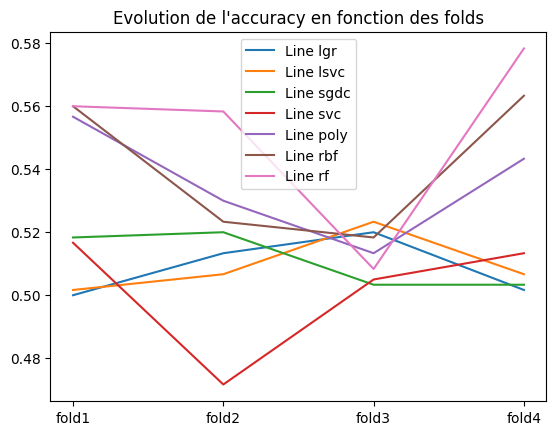

In [109]:
#Regardons l'évolution des scores pour chaque fold
for row in range(df_cross.shape[0]):
    plt.plot( df_cross.iloc[row,0:4] ,label='Line '+str(df_cross.iloc[row,5]))

plt.legend()
plt.title("Evolution de l'accuracy en fonction des folds")
plt.show()

In [76]:
for i in range(7):

    mean_model = df_cross.iloc[:,0:5].mean(axis=1)[i]
    std_model = df_cross.iloc[:,0:5].std(axis=1)[i]
    
    print('Le modèle N° '+ str(i) + ' a une accuray de '  + str(mean_model) + ' et un std : ' + str(std_model))

Le modèle N° 0 a une accuray de 0.5026666666666667 et un std : 0.015925172247455006
Le modèle N° 1 a une accuray de 0.5033333333333334 et un std : 0.01620185174601965
Le modèle N° 2 a une accuray de 0.5086666666666667 et un std : 0.009817784316682098
Le modèle N° 3 a une accuray de 0.5006666666666667 et un std : 0.01797374628605722
Le modèle N° 4 a une accuray de 0.5263333333333333 et un std : 0.026624967396954472
Le modèle N° 5 a une accuray de 0.5313333333333333 et un std : 0.03021680915575894
Le modèle N° 6 a une accuray de 0.5496666666666667 et un std : 0.026230813093679674


## Optimisation des modèles SVM non linéaires

In [81]:
params = [
    {"kernel": ["rbf"], "gamma": [0.01, 0.1,0.5,1,2], "C": [1, 10, 100, 1000]},
    {"kernel": ["poly"], "degree":[1,2,3,4],"C": [1, 10, 100, 1000]}
]

c_svc = SVC(random_state=42)

grid_c_svc = GridSearchCV(c_svc, param_grid=params, cv=5, return_train_score=True)

In [82]:
take_grid = grid_c_svc.fit(X_train, y_train)

In [83]:
#On garde le meilleur modèle et on refait un grid search uniquement sur ce modèle
print("La meilleur combinaison d'estimateur est: " + str(take_grid.best_params_)+"\n"
      "pour un score de: " + str(take_grid.best_score_))

La meilleur combinaison d'estimateur est: {'C': 1, 'gamma': 2, 'kernel': 'rbf'}
pour un score de: 0.562


In [84]:
#Examiner tous les fold par ordre
results_df = pd.DataFrame(take_grid.cv_results_)
results_df = results_df.sort_values(by=["rank_test_score"])
results_df = results_df.set_index(results_df["params"]\
                                  .apply(lambda x: "_".join(str(val) for val in x.values()))
                                 ).rename_axis("kernel")

results_df[["params", "rank_test_score", "mean_test_score", "std_test_score"]]

,params,rank_test_score,mean_test_score,std_test_score
kernel,,,,
1_2_rbf,"{'C': 1, 'gamma': 2, 'kernel': 'rbf'}",1,0.562000,0.015253
1000_2_rbf,"{'C': 1000, 'gamma': 2, 'kernel': 'rbf'}",2,0.551000,0.020456
10_2_rbf,"{'C': 10, 'gamma': 2, 'kernel': 'rbf'}",2,0.551000,0.020456
100_2_rbf,"{'C': 100, 'gamma': 2, 'kernel': 'rbf'}",2,0.551000,0.020456
1_0.5_rbf,"{'C': 1, 'gamma': 0.5, 'kernel': 'rbf'}",5,0.541667,0.031109
1_1_rbf,"{'C': 1, 'gamma': 1, 'kernel': 'rbf'}",6,0.541000,0.024599
1000_1_rbf,"{'C': 1000, 'gamma': 1, 'kernel': 'rbf'}",7,0.538667,0.029371
10_1_rbf,"{'C': 10, 'gamma': 1, 'kernel': 'rbf'}",7,0.538667,0.029371
100_1_rbf,"{'C': 100, 'gamma': 1, 'kernel': 'rbf'}",7,0.538667,0.029371


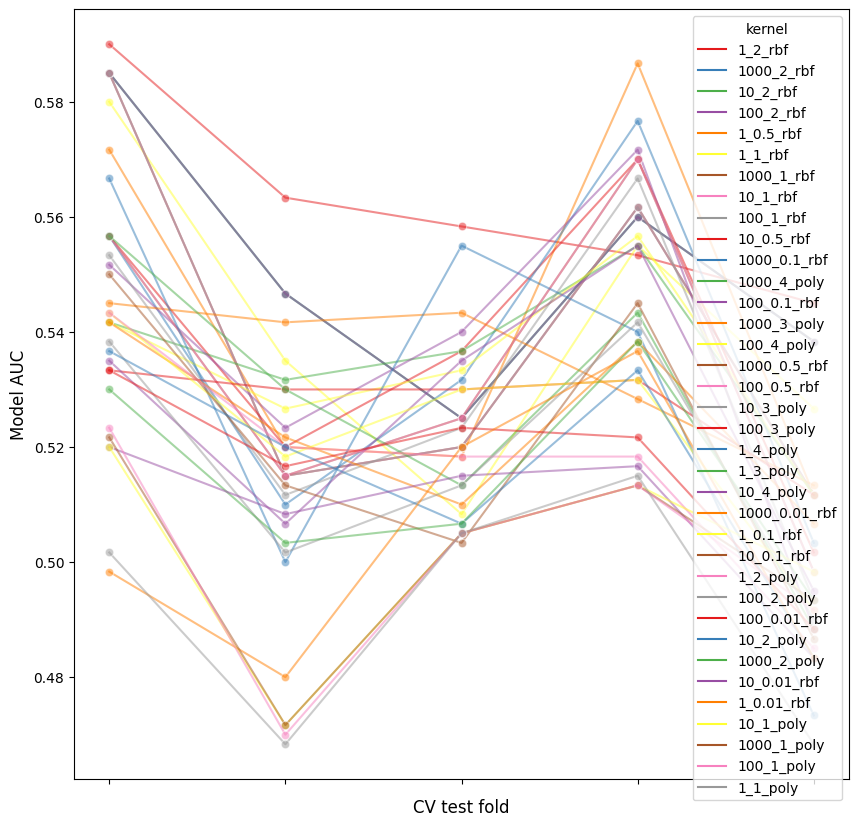

In [93]:
# create df of model scores ordered by performance
model_scores = results_df.filter(regex=r"split\d*_test_score")

# plot 30 examples of dependency between cv fold and AUC scores

fig, ax = plt.subplots(figsize=(10,10))
sns.lineplot(
    data=model_scores.transpose().iloc[:30],
    dashes=False,
    palette="Set1",
    marker="o",
    alpha=0.5,
    ax=ax,
)
ax.set_xlabel("CV test fold", size=12, labelpad=10)
ax.set_ylabel("Model AUC", size=12)
ax.tick_params(bottom=True, labelbottom=False)
plt.show()

In [85]:
# On entraîne le meilleur modèle
best_model = SVC(random_state=42, C=1, kernel='rbf',gamma=2)

In [86]:
best_model.fit(X_train, y_train)

SVC(C=1, gamma=2, random_state=42)

In [133]:
#Matrice de confusion sur le jeu de test

<Axes: title={'center': 'Confusion matrix'}, xlabel='Predicted label', ylabel='True label'>

<Figure size 300x200 with 0 Axes>

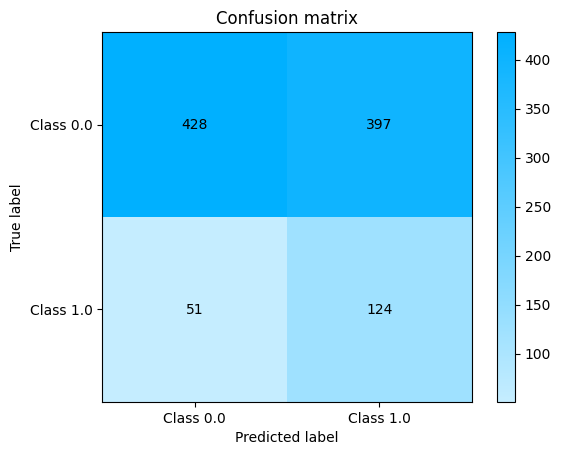

In [87]:
plt.figure(figsize=(3,2))
plot.confusion_matrix(best_model.predict(X_test), y_test)

In [88]:
print('Training score: ' + str(best_model.score(X_train,y_train)), 
      '\n',
      'Test score: ' + str(best_model.score(X_test, y_test))
     )

Training score: 1.0 
 Test score: 0.552


On observe qu'il y a du sur-apprentissage. On tente d'éviter cet inconvénient. 

In [87]:
best_model = SVC(random_state=42, C=0.1, kernel='rbf',gamma=0.1)
best_model.fit(X_train, y_train) ## C = 50 et gamma = 4 #diminuer le C augmente le score, changer C n'a pas beaucoup d'impact

SVC(C=0.1, gamma=0.1, random_state=42)

<Axes: title={'center': 'Confusion matrix'}, xlabel='Predicted label', ylabel='True label'>

<Figure size 300x200 with 0 Axes>

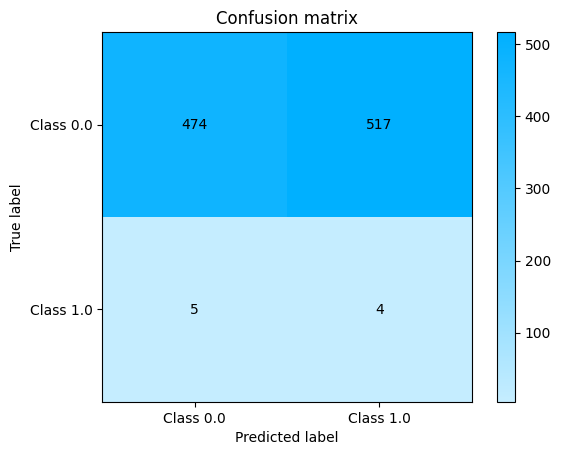

In [88]:
plt.figure(figsize=(3,2))
plot.confusion_matrix(best_model.predict(X_test), y_test)

In [89]:
print('Training score: ' + str(best_model.score(X_train,y_train)), 
      '\n',
      'Test score: ' + str(best_model.score(X_test, y_test))
     )

print("F1 Score:", f1_score(y_test, best_model.predict(X_test), average = 'weighted'))

Training score: 0.51 
 Test score: 0.478
F1 Score: 0.5119570558282234


## Optimisation du Random Forest

In [91]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'n_estimators': [100, 200, 500],  # Plus d'arbres
    'max_depth': [5, 10, 20, 30, 40],  # Profondeur maximale
    'min_samples_split': [2, 5, 10,15],  # Taille min de split
    'min_samples_leaf': [2,4,6,8],  # Taille min des feuilles
    'max_features' : ['sqrt'],
    'criterion': ['log_loss',"gini"]
}

rf = RandomForestClassifier(random_state=42)

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=50,  # Teste 30 configurations
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=2,
    random_state=42
)

In [92]:
random_search.fit(X_train, y_train)
print("Meilleurs paramètres (RandomizedSearch) :", random_search.best_params_)

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Meilleurs paramètres (RandomizedSearch) : {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 8, 'max_features': 'sqrt', 'max_depth': 30, 'criterion': 'log_loss'}


In [96]:
# Trier les résultats du meilleur au pire
# Récupérer tous les résultats
results_df = pd.DataFrame(random_search.cv_results_)
results_df = results_df.sort_values(by="rank_test_score")

# Afficher les meilleurs essais
results_df[['rank_test_score','mean_test_score', 'std_test_score', 'params']].head(10)

,rank_test_score,mean_test_score,std_test_score,params
41,1,-0.429667,0.020613,"{'n_estimators': 500, 'min_samples_split': 5, ..."
37,2,-0.435333,0.024390,"{'n_estimators': 500, 'min_samples_split': 5, ..."
32,3,-0.436000,0.021797,"{'n_estimators': 500, 'min_samples_split': 10,..."
34,3,-0.436000,0.021797,"{'n_estimators': 500, 'min_samples_split': 5, ..."
48,5,-0.436000,0.019849,"{'n_estimators': 500, 'min_samples_split': 15,..."
35,6,-0.436333,0.016411,"{'n_estimators': 100, 'min_samples_split': 15,..."
19,6,-0.436333,0.019760,"{'n_estimators': 500, 'min_samples_split': 15,..."
36,8,-0.437333,0.017308,"{'n_estimators': 500, 'min_samples_split': 2, ..."
24,8,-0.437333,0.029261,"{'n_estimators': 500, 'min_samples_split': 10,..."
26,10,-0.438000,0.023031,"{'n_estimators': 200, 'min_samples_split': 15,..."


In [26]:
# Modèle Random Forest
best_model_rf = RandomForestClassifier(n_estimators=500, random_state=42, max_depth=30,criterion="log_loss", max_features='sqrt', min_samples_split=5, min_samples_leaf=8)
best_model_rf.fit(X_train, y_train)

y_pred_rf_test = best_model_rf.predict(X_test)
y_pred_rf_train = best_model_rf.predict(X_train)

rf_mse_test = mean_squared_error(y_test, y_pred_rf_test)
rf_mse_train = mean_squared_error(y_train, y_pred_rf_train)

print(f"Random Forest MSE TRAIN: {rf_mse_train:.4f}")
print(f"Random Forest MSE TEST: {rf_mse_test:.4f}")

print('Training score: ' + str(best_model_rf.score(X_train,y_train)), 
      '\n',
      'Test score: ' + str(best_model_rf.score(X_test, y_test))
     )

Random Forest MSE TRAIN: 0.0347
Random Forest MSE TEST: 0.4540
Training score: 0.9653333333333334 
 Test score: 0.546


<Axes: title={'center': 'Confusion matrix'}, xlabel='Predicted label', ylabel='True label'>

<Figure size 300x200 with 0 Axes>

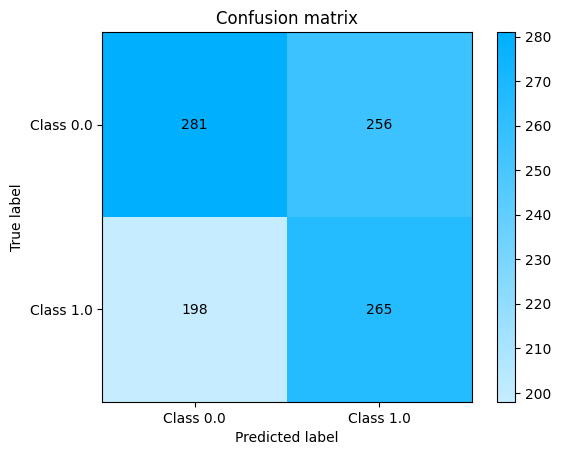

In [105]:
plt.figure(figsize=(3,2))
plot.confusion_matrix(best_model_rf.predict(X_test), y_test)

Ce résultat suggère un grand sur-apprentissage. Donc, on essaye de l'éviter.

In [103]:
# Modèle Random Forest
best_model_rf = RandomForestClassifier(n_estimators=50, random_state=42, max_depth=1, min_samples_split=10, min_samples_leaf=10, max_features='sqrt', criterion="log_loss")
best_model_rf.fit(X_train, y_train)

y_pred_rf_test = best_model_rf.predict(X_test)
y_pred_rf_train = best_model_rf.predict(X_train)

rf_mse_test = mean_squared_error(y_test, y_pred_rf_test)
rf_mse_train = mean_squared_error(y_train, y_pred_rf_train)

print(f"Random Forest MSE TRAIN: {rf_mse_train:.4f}")
print(f"Random Forest MSE TEST: {rf_mse_test:.4f}")

Random Forest MSE TRAIN: 0.4850
Random Forest MSE TEST: 0.5160


Il n'y a plus de sur-apprentissage, cependant, le MSE sur le jeu de test a dû augmenter de 0.45 à 0.50

<Axes: title={'center': 'Confusion matrix'}, xlabel='Predicted label', ylabel='True label'>

<Figure size 300x200 with 0 Axes>

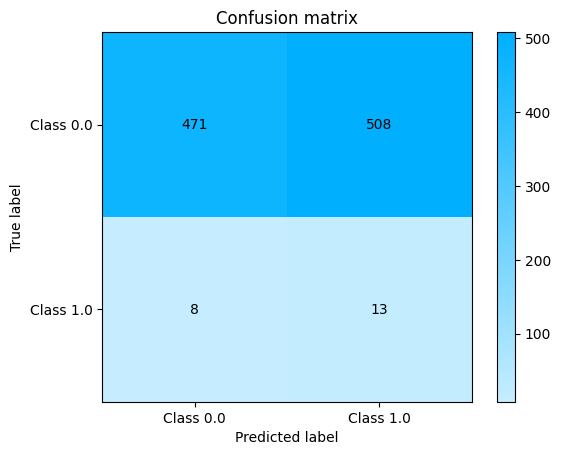

In [101]:
plt.figure(figsize=(3,2))
plot.confusion_matrix(best_model_rf.predict(X_test), y_test)

In [102]:
print('Training score: ' + str(best_model_rf.score(X_train,y_train)), 
      '\n',
      'Test score: ' + str(best_model_rf.score(X_test, y_test))
     )

Training score: 0.515 
 Test score: 0.484


## Re-traitement des données

In [4]:
heart = pd.read_csv("C:/Users/yavav/Downloads/heart_attack_risk_dataset.csv")

In [5]:
# transformer les variables quantitatives en float
heart['Age'] = heart['Age'].astype(float)
heart['BMI'] = heart['BMI'].astype(float)   
heart['Cholesterol_Level'] = heart['Cholesterol_Level'].astype(float)
heart['Resting_BP'] = heart['Resting_BP'].astype(float)
heart['Heart_Rate'] = heart['Heart_Rate'].astype(float) 
heart['Max_Heart_Rate_Achieved'] = heart['Max_Heart_Rate_Achieved'].astype(float)
# Séparation des variables qualitatives et quantitatives
qualitative_vars = heart.select_dtypes(include='object').columns.drop('Heart_Attack_Risk').tolist()
quantitative_vars = heart.select_dtypes(include=['float64']).columns.tolist()
binary_vars = heart.select_dtypes(include=['int64']).columns.tolist()

print("Variables qualitatives:", qualitative_vars)
print("Variables quantitatives:", quantitative_vars)
print("Variables binaires:", binary_vars)

Variables qualitatives: ['Gender', 'Physical_Activity_Level', 'Stress_Level', 'Chest_Pain_Type', 'Thalassemia', 'ECG_Results']
Variables quantitatives: ['Age', 'BMI', 'Cholesterol_Level', 'Resting_BP', 'Heart_Rate', 'Max_Heart_Rate_Achieved']
Variables binaires: ['Smoking', 'Alcohol_Consumption', 'Diabetes', 'Hypertension', 'Family_History', 'Fasting_Blood_Sugar', 'Exercise_Induced_Angina']


In [6]:
heart2 = heart[heart['Heart_Attack_Risk'] != 'Moderate']
print(heart2['Heart_Attack_Risk'].value_counts())
print(heart2.shape)

Low     25024
High    10072
Name: Heart_Attack_Risk, dtype: int64
(35096, 20)


In [7]:
heart2['Heart_Attack_Risk'] = heart2['Heart_Attack_Risk'].replace({'Low': 0, 'High': 1})
heart2['Heart_Attack_Risk'].unique()
heart2.head(15)

C:\Users\yavav\AppData\Local\Temp\ipykernel_14624\2993541912.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  heart2['Heart_Attack_Risk'] = heart2['Heart_Attack_Risk'].replace({'Low': 0, 'High': 1})


,Age,Gender,Smoking,Alcohol_Consumption,Physical_Activity_Level,BMI,Diabetes,Hypertension,Cholesterol_Level,Resting_BP,Heart_Rate,Family_History,Stress_Level,Chest_Pain_Type,Thalassemia,Fasting_Blood_Sugar,ECG_Results,Exercise_Induced_Angina,Max_Heart_Rate_Achieved,Heart_Attack_Risk
0,69.0,Female,1,0,Moderate,34.61,1,0,152.1,171.0,85.0,0,Moderate,Non-anginal,Reversible defect,0,Normal,0,114.0,0
2,89.0,Male,0,1,Moderate,35.32,0,0,272.3,123.0,127.0,0,Low,Typical,Reversible defect,0,ST-T abnormality,0,109.0,0
3,78.0,Male,0,1,Moderate,18.23,1,0,237.7,144.0,125.0,0,Low,Typical,Fixed defect,1,Left Ventricular Hypertrophy,0,129.0,0
5,41.0,Male,0,1,Moderate,36.11,0,0,271.2,141.0,119.0,0,Low,Atypical,Fixed defect,0,Normal,0,101.0,1
6,20.0,Male,1,0,Low,15.12,0,0,164.8,154.0,67.0,0,Low,Non-anginal,Normal,0,Normal,0,176.0,0
10,47.0,Male,1,0,Moderate,29.86,0,1,225.7,110.0,71.0,0,Moderate,Non-anginal,Reversible defect,1,Normal,0,146.0,0
11,55.0,Female,0,0,Moderate,31.32,0,0,280.2,113.0,105.0,0,Low,Asymptomatic,Normal,0,Left Ventricular Hypertrophy,1,124.0,1
14,77.0,Male,0,0,High,20.18,0,1,298.5,178.0,94.0,0,Low,Asymptomatic,Fixed defect,0,ST-T abnormality,0,159.0,0
15,38.0,Female,1,0,High,28.49,0,1,272.4,125.0,64.0,0,Moderate,Non-anginal,Reversible defect,0,Normal,0,161.0,0
16,50.0,Male,1,0,Moderate,33.75,0,0,256.0,159.0,117.0,0,Moderate,Asymptomatic,Normal,0,ST-T abnormality,1,156.0,0


In [32]:
print(heart2.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 35096 entries, 0 to 49997
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      35096 non-null  float64
 1   Gender                   35096 non-null  object 
 2   Smoking                  35096 non-null  int64  
 3   Alcohol_Consumption      35096 non-null  int64  
 4   Physical_Activity_Level  35096 non-null  object 
 5   BMI                      35096 non-null  float64
 6   Diabetes                 35096 non-null  int64  
 7   Hypertension             35096 non-null  int64  
 8   Cholesterol_Level        35096 non-null  float64
 9   Resting_BP               35096 non-null  float64
 10  Heart_Rate               35096 non-null  float64
 11  Family_History           35096 non-null  int64  
 12  Stress_Level             35096 non-null  object 
 13  Chest_Pain_Type          35096 non-null  object 
 14  Thalassemia           

In [8]:
# meilleurs modèles avec la base de données avec deux modalités dans la variable cible
# séparation des données en train et test
X2 = heart2.drop(columns=['Heart_Attack_Risk'])
y2 = heart2['Heart_Attack_Risk']
# encodage des variables explicatives avec label encoding 
from sklearn.compose import ColumnTransformer

In [9]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
le = LabelEncoder()
X2[qualitative_vars] = X2[qualitative_vars].apply(le.fit_transform)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3, random_state=42, stratify=y2)

## Sélection de variables

In [10]:
# selection des features
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import RFE
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, roc_auc_score
# SelectKBest
kbest2 = SelectKBest(score_func=f_classif, k=7)  # Select top 5 features
X2_kbest = kbest2.fit_transform(X2_train, y2_train)
selected_features_kbest2 = X2_train.columns[kbest2.get_support()]
print("Selected features using SelectKBest:", selected_features_kbest2.tolist())

Selected features using SelectKBest: ['Gender', 'Alcohol_Consumption', 'Physical_Activity_Level', 'Hypertension', 'Resting_BP', 'Heart_Rate', 'Thalassemia']


In [11]:
#On définit les features sélectionnées
X2_train_kbest = X2_train[selected_features_kbest2]
X2_test_kbest = X2_test[selected_features_kbest2]

### Random Forest avec les features sélectionnés par SelectKBest

In [54]:
# Random Forest avec les features sélectionnés par SelectKBest

rf_model_kbest2 = RandomForestClassifier(random_state=42, class_weight='balanced')
rf_model_kbest2.fit(X2_train_kbest, y2_train)

# Prédictions pour train et test
y2_pred_rf_kbest_train = rf_model_kbest2.predict(X2_train_kbest)
y2_pred_rf_kbest_test = rf_model_kbest2.predict(X2_test_kbest)

# Métriques pour le train
print("Classification Report for Random Forest (Train) with SelectKBest features:")
print(classification_report(y2_train, y2_pred_rf_kbest_train))
print("Confusion Matrix for Random Forest (Train) with SelectKBest features:")
print(confusion_matrix(y2_train, y2_pred_rf_kbest_train))
print("Accuracy for Random Forest (Train) with SelectKBest features:", accuracy_score(y2_train, y2_pred_rf_kbest_train))
print("F1 Score for Random Forest (Train) with SelectKBest features:", f1_score(y2_train, y2_pred_rf_kbest_train, average='weighted'))

# Métriques pour le test
print("\nClassification Report for Random Forest (Test) with SelectKBest features:")
print(classification_report(y2_test, y2_pred_rf_kbest_test))
print("Confusion Matrix for Random Forest (Test) with SelectKBest features:")
print(confusion_matrix(y2_test, y2_pred_rf_kbest_test))
print("Accuracy for Random Forest (Test) with SelectKBest features:", accuracy_score(y2_test, y2_pred_rf_kbest_test))
print("F1 Score for Random Forest (Test) with SelectKBest features:", f1_score(y2_test, y2_pred_rf_kbest_test, average='weighted'))


Classification Report for Random Forest (Train) with SelectKBest features:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17517
           1       0.96      0.99      0.98      7050

    accuracy                           0.99     24567
   macro avg       0.98      0.99      0.98     24567
weighted avg       0.99      0.99      0.99     24567

Confusion Matrix for Random Forest (Train) with SelectKBest features:
[[17239   278]
 [   68  6982]]
Accuracy for Random Forest (Train) with SelectKBest features: 0.9859160662677575
F1 Score for Random Forest (Train) with SelectKBest features: 0.9859769421593956

Classification Report for Random Forest (Test) with SelectKBest features:
              precision    recall  f1-score   support

           0       0.71      0.84      0.77      7507
           1       0.29      0.16      0.20      3022

    accuracy                           0.65     10529
   macro avg       0.50      0.50      0.4

### Modèle XGBoost avec les features sélectionnés par SelectKBest

In [55]:
# modèle XGBoost avec les features sélectionnés par SelectKBest
xgb_model_kbest2 = XGBClassifier(random_state=42, class_weight='balanced', use_label_encoder=False, eval_metric='mlogloss')
xgb_model_kbest2.fit(X2_train_kbest, y2_train)

# Prédictions pour le train et le test
y2_pred_xgb_kbest_train_encoded = xgb_model_kbest2.predict(X2_train_kbest)
y2_pred_xgb_kbest_test_encoded = xgb_model_kbest2.predict(X2_test_kbest)

# Decode the predictions back to string labels for comparison
y2_pred_xgb_kbest_train = le.inverse_transform(y2_pred_xgb_kbest_train_encoded)
y2_pred_xgb_kbest_test = le.inverse_transform(y2_pred_xgb_kbest_test_encoded)

# Métriques pour le train
print("Classification Report for XGBoost (Train) with SelectKBest features:")
print(classification_report(y2_train, y2_pred_xgb_kbest_train))
print("Confusion Matrix for XGBoost (Train) with SelectKBest features:")
print(confusion_matrix(y2_train, y2_pred_xgb_kbest_train))
print("Accuracy for XGBoost (Train) with SelectKBest features:", accuracy_score(y2_train, y2_pred_xgb_kbest_train))
print("F1 Score for XGBoost (Train) with SelectKBest features:", f1_score(y2_train, y2_pred_xgb_kbest_train, average='weighted'))

# Métriques pour le test
print("\nClassification Report for XGBoost (Test) with SelectKBest features:")
print(classification_report(y2_test, y2_pred_xgb_kbest_test))
print("Confusion Matrix for XGBoost (Test) with SelectKBest features:")
print(confusion_matrix(y2_test, y2_pred_xgb_kbest_test))
print("Accuracy for XGBoost (Test) with SelectKBest features:", accuracy_score(y2_test, y2_pred_xgb_kbest_test))
print("F1 Score for XGBoost (Test) with SelectKBest features:", f1_score(y2_test, y2_pred_xgb_kbest_test, average='weighted'))

C:\Users\yavav\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [02:03:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "class_weight", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report for XGBoost (Train) with SelectKBest features:
              precision    recall  f1-score   support

           0       0.74      0.99      0.85     17517
           1       0.86      0.14      0.23      7050

    accuracy                           0.75     24567
   macro avg       0.80      0.56      0.54     24567
weighted avg       0.78      0.75      0.67     24567

Confusion Matrix for XGBoost (Train) with SelectKBest features:
[[17367   150]
 [ 6093   957]]
Accuracy for XGBoost (Train) with SelectKBest features: 0.7458786176578337
F1 Score for XGBoost (Train) with SelectKBest features: 0.671733100557103

Classification Report for XGBoost (Test) with SelectKBest features:
              precision    recall  f1-score   support

           0       0.71      0.96      0.82      7507
           1       0.33      0.05      0.08      3022

    accuracy                           0.70     10529
   macro avg       0.52      0.50      0.45     10529
weighted avg       

### Tunage du modèle XGBClassifier (plus performant que le Random Forest)

In [40]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb_model_kbest2 = XGBClassifier(random_state=42, class_weight='balanced', use_label_encoder=False, eval_metric='mlogloss')

grid_search = GridSearchCV(estimator=xgb_model_kbest2, param_grid=param_grid, cv=5, scoring='f1_weighted', n_jobs=-1, verbose=2)

grid_search.fit(X2_train_kbest, y2_train)

best_params = grid_search.best_params_
best_xgb_model = grid_search.best_estimator_

# Évaluation sur les données de test
y2_pred_xgb_kbest_encoded = best_xgb_model.predict(X2_test_kbest)

print("Classification Report for Tuned XGBoost with SelectKBest features (Test):")
print(classification_report(y2_test, y2_pred_xgb_kbest_encoded))
print("Confusion Matrix for Tuned XGBoost with SelectKBest features (Test):")
print(confusion_matrix(y2_test, y2_pred_xgb_kbest_encoded))
print("Accuracy for Tuned XGBoost with SelectKBest features (Test):", accuracy_score(y2_test, y2_pred_xgb_kbest_encoded))
print("F1 Score for Tuned XGBoost with SelectKBest features (Test):", f1_score(y2_test, y2_pred_xgb_kbest_encoded, average='weighted'))

# Évaluation sur les données de train
y2_pred_xgb_train_encoded = best_xgb_model.predict(X2_train_kbest)

print("\nClassification Report for Tuned XGBoost with SelectKBest features (Train):")
print(classification_report(y2_train, y2_pred_xgb_train_encoded))
print("Confusion Matrix for Tuned XGBoost with SelectKBest features (Train):")
print(confusion_matrix(y2_train, y2_pred_xgb_train_encoded))
print("Accuracy for Tuned XGBoost with SelectKBest features (Train):", accuracy_score(y2_train, y2_pred_xgb_train_encoded))
print("F1 Score for Tuned XGBoost with SelectKBest features (Train):", f1_score(y2_train, y2_pred_xgb_train_encoded, average='weighted'))

Fitting 5 folds for each of 108 candidates, totalling 540 fits


C:\Users\yavav\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [01:21:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "class_weight", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report for Tuned XGBoost with SelectKBest features (Test):
              precision    recall  f1-score   support

           0       0.71      0.91      0.80      7507
           1       0.30      0.10      0.15      3022

    accuracy                           0.68     10529
   macro avg       0.51      0.50      0.47     10529
weighted avg       0.59      0.68      0.61     10529

Confusion Matrix for Tuned XGBoost with SelectKBest features (Test):
[[6821  686]
 [2731  291]]
Accuracy for Tuned XGBoost with SelectKBest features (Test): 0.6754677557222908
F1 Score for Tuned XGBoost with SelectKBest features (Test): 0.611940605539061

Classification Report for Tuned XGBoost with SelectKBest features (Train):
              precision    recall  f1-score   support

           0       0.79      0.98      0.88     17517
           1       0.89      0.36      0.52      7050

    accuracy                           0.81     24567
   macro avg       0.84      0.67      0.70     24

### Régression de logistique avec sélection de variable comme référence pour comparer le XGB Classifier

In [56]:
# Modèle de régression logistique avec les kbest features de heart2
log_reg_model_kbest2 = LogisticRegression(random_state=42, class_weight='balanced', max_iter=1000)
log_reg_model_kbest2.fit(X2_train_kbest, y2_train)

# Prédictions sur les données de test
y2_pred_log_reg_kbest = log_reg_model_kbest2.predict(X2_test_kbest)

# Prédictions sur les données de train
y2_train_pred_log_reg_kbest = log_reg_model_kbest2.predict(X2_train_kbest)

# Évaluation du modèle sur le jeu de test
print("Classification Report for Logistic Regression with SelectKBest features (Test):")
print(classification_report(y2_test, y2_pred_log_reg_kbest))
print("Confusion Matrix for Logistic Regression with SelectKBest features (Test):")
print(confusion_matrix(y2_test, y2_pred_log_reg_kbest))
print("Accuracy for Logistic Regression with SelectKBest features (Test):", accuracy_score(y2_test, y2_pred_log_reg_kbest))
print("F1 Score for Logistic Regression with SelectKBest features (Test):", f1_score(y2_test, y2_pred_log_reg_kbest, average='weighted'))

# Évaluation du modèle sur le jeu de train
print("\nClassification Report for Logistic Regression with SelectKBest features (Train):")
print(classification_report(y2_train, y2_train_pred_log_reg_kbest))
print("Confusion Matrix for Logistic Regression with SelectKBest features (Train):")
print(confusion_matrix(y2_train, y2_train_pred_log_reg_kbest))
print("Accuracy for Logistic Regression with SelectKBest features (Train):", accuracy_score(y2_train, y2_train_pred_log_reg_kbest))
print("F1 Score for Logistic Regression with SelectKBest features (Train):", f1_score(y2_train, y2_train_pred_log_reg_kbest, average='weighted'))

Classification Report for Logistic Regression with SelectKBest features (Test):
              precision    recall  f1-score   support

           0       0.71      0.51      0.60      7507
           1       0.29      0.49      0.36      3022

    accuracy                           0.51     10529
   macro avg       0.50      0.50      0.48     10529
weighted avg       0.59      0.51      0.53     10529

Confusion Matrix for Logistic Regression with SelectKBest features (Test):
[[3850 3657]
 [1542 1480]]
Accuracy for Logistic Regression with SelectKBest features (Test): 0.5062209136670149
F1 Score for Logistic Regression with SelectKBest features (Test): 0.5297388079379324

Classification Report for Logistic Regression with SelectKBest features (Train):
              precision    recall  f1-score   support

           0       0.72      0.51      0.60     17517
           1       0.30      0.52      0.38      7050

    accuracy                           0.51     24567
   macro avg       

### Interprétation de la Régression Logistique

In [57]:
# coefficients du modèle de régression logistique

log_reg_coefficients = log_reg_model_kbest2.coef_[0]
log_reg_intercept = log_reg_model_kbest2.intercept_[0]
print("Coefficients of Logistic Regression with SelectKBest features:")
for feature, coef in zip(selected_features_kbest2, log_reg_coefficients):
    print(f"{feature}: {coef}")
print("Intercept of Logistic Regression with SelectKBest features:", log_reg_intercept)


Coefficients of Logistic Regression with SelectKBest features:
Gender: -0.033863137380955866
Alcohol_Consumption: 0.027099221829359588
Physical_Activity_Level: -0.017119923353595412
Hypertension: -0.04846010232862837
Resting_BP: -0.0008907372678913757
Heart_Rate: 0.001326285254923381
Thalassemia: 0.028738949613707935
Intercept of Logistic Regression with SelectKBest features: 0.005132935957476006


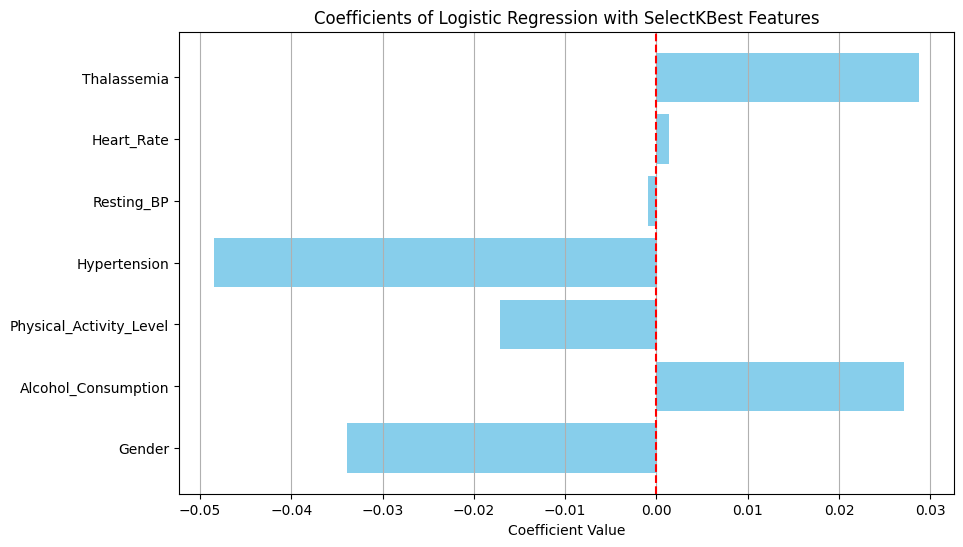

In [58]:
# graphique des coefficients du modèle de régression logistique

import matplotlib.pyplot as plt
import numpy as np

# Coefficients of the logistic regression model
log_reg_coefficients = log_reg_model_kbest2.coef_[0]
log_reg_intercept = log_reg_model_kbest2.intercept_[0]

# Create a bar plot of the coefficients
plt.figure(figsize=(10, 6))
plt.barh(selected_features_kbest2, log_reg_coefficients, color='skyblue')
plt.xlabel('Coefficient Value')
plt.title('Coefficients of Logistic Regression with SelectKBest Features')
plt.axvline(0, color='red', linestyle='--')
plt.grid(axis='x')
plt.show()

## Interprétabilité du XGBoost

In [12]:
# Feature Importance using XGBoost
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, roc_auc_score
from xgboost import plot_importance

In [13]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

xgb_model_kbest2 = XGBClassifier(random_state=42, class_weight='balanced', use_label_encoder=False, eval_metric='mlogloss')

grid_search = GridSearchCV(estimator=xgb_model_kbest2, param_grid=param_grid, cv=5, scoring='f1_weighted', n_jobs=-1, verbose=2)

grid_search.fit(X2_train_kbest, y2_train)

best_params = grid_search.best_params_
best_xgb_model = grid_search.best_estimator_

# Évaluation sur les données de test
y2_pred_xgb_kbest_encoded = best_xgb_model.predict(X2_test_kbest)

print("Classification Report for Tuned XGBoost with SelectKBest features (Test):")
print(classification_report(y2_test, y2_pred_xgb_kbest_encoded))
print("Confusion Matrix for Tuned XGBoost with SelectKBest features (Test):")
print(confusion_matrix(y2_test, y2_pred_xgb_kbest_encoded))
print("Accuracy for Tuned XGBoost with SelectKBest features (Test):", accuracy_score(y2_test, y2_pred_xgb_kbest_encoded))
print("F1 Score for Tuned XGBoost with SelectKBest features (Test):", f1_score(y2_test, y2_pred_xgb_kbest_encoded, average='weighted'))

# Évaluation sur les données de train
y2_pred_xgb_train_encoded = best_xgb_model.predict(X2_train_kbest)

print("\nClassification Report for Tuned XGBoost with SelectKBest features (Train):")
print(classification_report(y2_train, y2_pred_xgb_train_encoded))
print("Confusion Matrix for Tuned XGBoost with SelectKBest features (Train):")
print(confusion_matrix(y2_train, y2_pred_xgb_train_encoded))
print("Accuracy for Tuned XGBoost with SelectKBest features (Train):", accuracy_score(y2_train, y2_pred_xgb_train_encoded))
print("F1 Score for Tuned XGBoost with SelectKBest features (Train):", f1_score(y2_train, y2_pred_xgb_train_encoded, average='weighted'))

Fitting 5 folds for each of 108 candidates, totalling 540 fits


C:\Users\yavav\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [15:37:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-08cbc0333d8d4aae1-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "class_weight", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report for Tuned XGBoost with SelectKBest features (Test):
              precision    recall  f1-score   support

           0       0.71      0.91      0.80      7507
           1       0.30      0.10      0.15      3022

    accuracy                           0.68     10529
   macro avg       0.51      0.50      0.47     10529
weighted avg       0.59      0.68      0.61     10529

Confusion Matrix for Tuned XGBoost with SelectKBest features (Test):
[[6821  686]
 [2731  291]]
Accuracy for Tuned XGBoost with SelectKBest features (Test): 0.6754677557222908
F1 Score for Tuned XGBoost with SelectKBest features (Test): 0.611940605539061

Classification Report for Tuned XGBoost with SelectKBest features (Train):
              precision    recall  f1-score   support

           0       0.79      0.98      0.88     17517
           1       0.89      0.36      0.52      7050

    accuracy                           0.81     24567
   macro avg       0.84      0.67      0.70     24

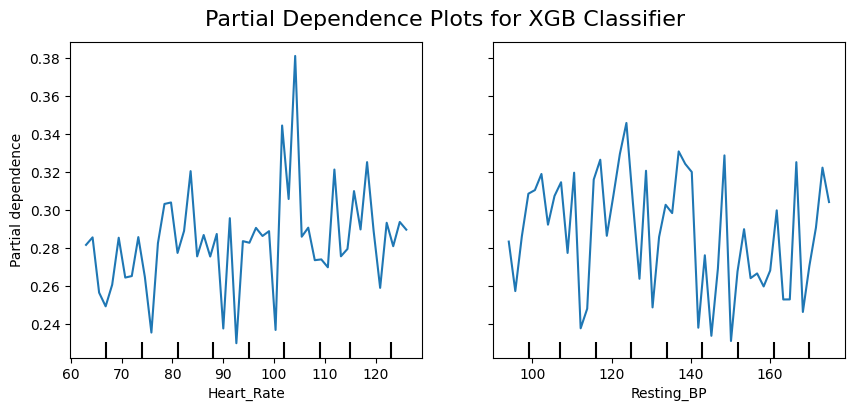

In [14]:
from sklearn.inspection import PartialDependenceDisplay

features = ['Heart_Rate', 'Resting_BP']
fig, ax = plt.subplots(figsize=(10, 4))
PartialDependenceDisplay.from_estimator(best_xgb_model, X2_train_kbest, features, grid_resolution=50, ax=ax)
plt.suptitle('Partial Dependence Plots for XGB Classifier', fontsize=16)
plt.subplots_adjust(top=0.9) 
plt.show()

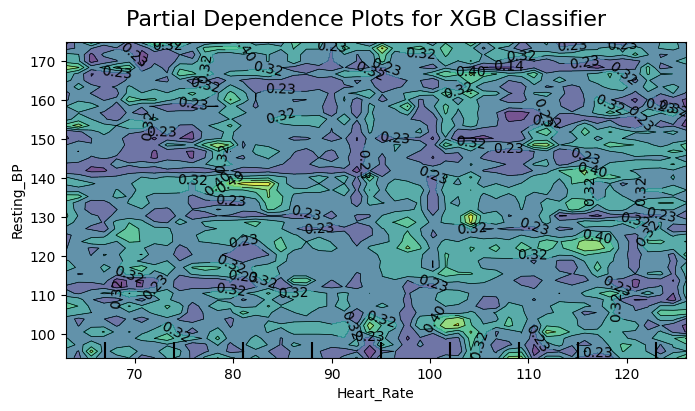

In [18]:
from sklearn.inspection import PartialDependenceDisplay

features = [('Heart_Rate', 'Resting_BP')]
fig, ax = plt.subplots(figsize=(8, 4))
PartialDependenceDisplay.from_estimator(best_xgb_model, X2_train_kbest, features, grid_resolution=50, ax=ax)
plt.suptitle('Partial Dependence Plots for XGB Classifier', fontsize=16)
plt.subplots_adjust(top=0.9) 
plt.show()

array([[<Axes: xlabel='Heart_Rate', ylabel='ALE'>,
        <Axes: xlabel='Resting_BP', ylabel='ALE'>]], dtype=object)

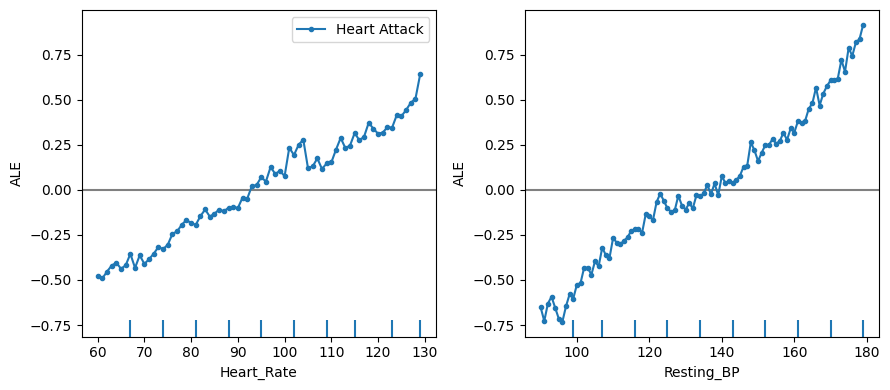

In [65]:
from alibi.explainers import ALE, plot_ale
xgb_ale = ALE(best_xgb_model.predict, #Methode predict de votre modèle

             feature_names=X2_train_kbest.columns, # Liste des features où il faut calculer l'ALE

             target_names=["Heart Attack"] # Nom de la target

) 
xgb_exp = xgb_ale.explain(X2_train_kbest.to_numpy(), min_bin_points=10) 
_, ax1 = plt.subplots(figsize = (9,4))

plot_ale(xgb_exp, features= ['Heart_Rate', 'Resting_BP'], ax= ax1, targets=[0])

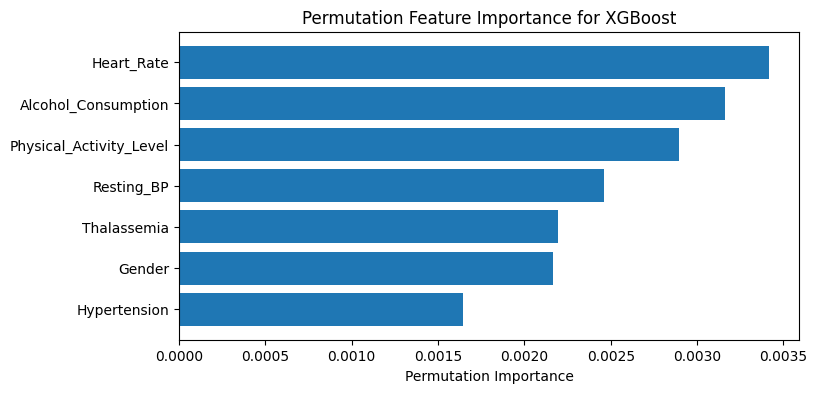

In [67]:
from sklearn.inspection import permutation_importance

# Use the test set for permutation importance
perm_importance = permutation_importance(best_xgb_model, X2_test_kbest, y2_test, n_repeats=10, random_state=42, n_jobs=-1)

sorted_idx = perm_importance.importances_mean.argsort()
plt.figure(figsize=(8, 4))
plt.barh(X2_test_kbest.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")
plt.title("Permutation Feature Importance for XGBoost")
plt.show()

## Interprétabilité par individu

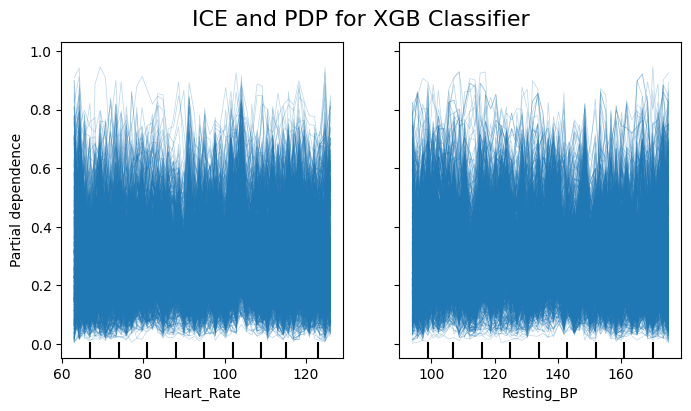

In [69]:
from sklearn.inspection import PartialDependenceDisplay
features = ['Heart_Rate', 'Resting_BP']
fig, ax = plt.subplots(figsize=(8, 4))
PartialDependenceDisplay.from_estimator(best_xgb_model, X2_train_kbest, features, kind='individual', grid_resolution=50, ax=ax)
plt.suptitle('ICE and PDP for XGB Classifier', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

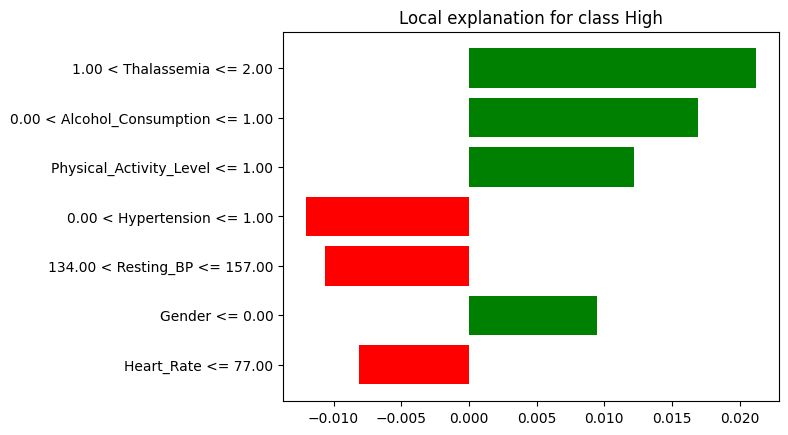

In [70]:
import lime

import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X2_train_kbest.values,
    feature_names=X2_train_kbest.columns,
    class_names=['Low', 'High'],
    mode='classification'
)

i = 876  # Index de l'individu à expliquer
instance = X2_test_kbest.iloc[i].values

exp = explainer.explain_instance(instance, best_xgb_model.predict_proba, num_features=10)

exp.show_in_notebook(show_table=True, show_all=False)
exp.as_pyplot_figure()
plt.show()

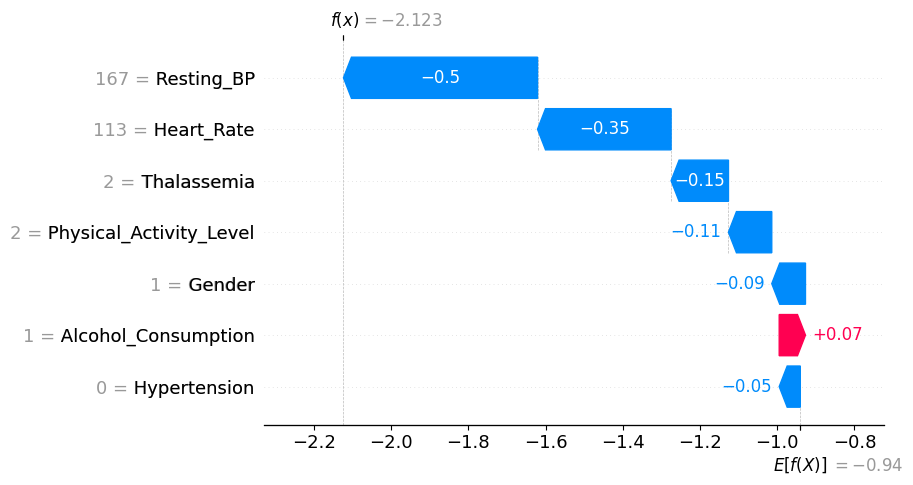

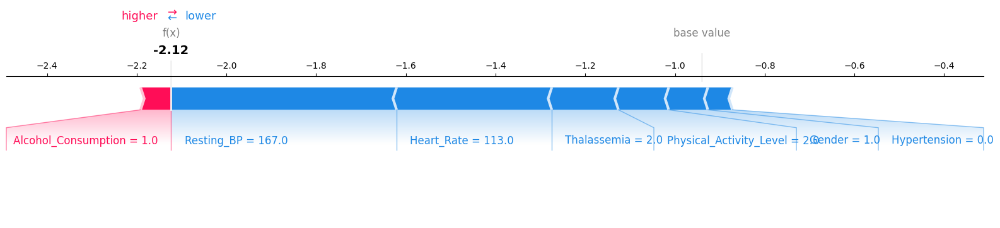

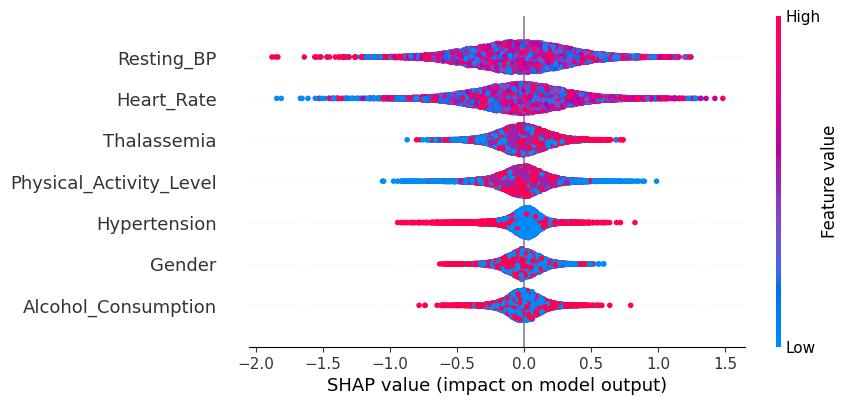

In [19]:
import shap

index = 876

explainer = shap.TreeExplainer(best_xgb_model)
shap_values = explainer(X2_train_kbest)

shap.initjs()

# Plot the SHAP waterfall plot
shap.waterfall_plot(shap_values[index])
shap.force_plot(shap_values[index], matplotlib=True, show=True)

shap.plots.beeswarm(shap_values)